In [124]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [125]:
import pandas as pd
import xarray as xr
import numpy as np
from datetime import date, time
from matplotlib import pyplot as plt

# load replace utility from dataclasses to manipulate SSRS configuration
from dataclasses import replace

from ssrs import Simulator, Config

import geopandas as gpd
import os
from ssrs.raster import transform_coordinates
import matplotlib.patches as patches

# Comparison of slope and aspect maps between 3DEP at different resolutions and manually computed from DEM -- Altamont Pass region

Note: To execute this notebook, you should checkout the specific commit in which this notebook was _added_. This notebook is a study showing why the orographic quantities are computed at higher resolution. It is for information purposes only and not a tutorial or example on the usage of SSRS.


#### Conclusions of the study presented here:

Calculating quantities using 50-m DEM elevation map results in slope and aspect maps that can be quite different from the same quantities downloaded from 3DEP. Ideally, we want to be able to _compute_ both aspect and slope based on a certain elevation map. If the elevation map is obtained from 3DEP, then the calculated quantities should match the 3DEP. This is needed for blurred versions of the elevation map. 

As shown here, using a 10-m grid for DEM and subsequent calculation of slope and aspect, the results match nicely those downloaded from 3DEP. Therefore, we will change the logic in the handling of these quantities. Now, these quantities will always be _computed_ rather than _downloaded_ from 3DEP. Here we showed that computing them from a 10-m DEM results in similar slope and aspect maps. In order to compute tham accurately, we will _always_ use DEM-related quantities at 10-m grid, regardless of what the user sets as `resolution`. The `resolution` variable is related to the resolution in which the rest of the analysis is conducted. After the slope and aspect are computed using the 10-m resolution DEM, they will be upsampled to match the `resolution` resolution. Even though not recommended, the user can change the high-resolution DEM resolution through the `resolution_terrain` variable; the default being 10 m.

In [3]:
default_config = Config()

# Default Altamont Pass parameters
default_config =replace(
    default_config, 
    fig_height=8.,
    sim_seed = -1,
    southwest_lonlat = (-121.72, 37.53),
    region_width_km = (30.0, 30.0),
    sim_mode = 'uniform',
    uniform_windspeed = 8.0,
    uniform_winddirn = 225.0,
    uniform_windspeed_h = 8.0,
    uniform_winddirn_h = 225.0,
    href = 80.0,
    uniform_windspeed_href = 8.0,
    uniform_winddirn_href = 225.0,
    turbine_minimum_hubheight = 70.,
    track_direction = 0,
    track_count = 500,
    track_start_region = (2, 28, 0, 1),
    track_dirn_restrict = 2,
    track_stochastic_nu = 1.0,
    turbine_mrkr_size = 10.,
    updraft_threshold = 0.75,
    orographic_model = 'original',
)

## Computing slope and aspect

In [4]:
# 5 m resolution, computing slope and aspect
oro_ori_compute_5m =replace(
    default_config, 
    run_name='altamont_orographic_original_compute_5m',
    resolution = 5.,
    slopeAspectMode = 'compute',
)

# initiate the SSRS simulation object
altpass_sim_original_compute_5m = Simulator(oro_ori_compute_5m)


---- SSRS in uniform mode
---- movements based on fluid-analogy model
---- using ruleset default
Run name: altamont_orographic_original_compute_5m
Output dir: /lustre/eaglefs/projects/car/rthedin/SSRS/notebooks/output/altamont_orographic_original_compute_5m
Terrain resolution = 5.0 m
Terrain grid size = (6000, 6000)
Terrain: Bounds set to [-121.82, 37.53, -121.37, 37.84]
Terrain: Found saved raster data for DEM
TurbinesUSWTB: Importing turbine data from USWTB..
Uniform mode: Wind speed = 8.0 m/s
Uniform mode: Wind dirn = 225.0 deg(cw)
Computing orographic updrafts using original model..
Manually computing slope..
Manually computing aspect..
computing original updraft
No thermals requested!
SSRS Simulator initiation done.


In [5]:
# 10 m resolution, computing slope and aspect
oro_ori_compute_10m =replace(
    default_config, 
    run_name='altamont_orographic_original_compute_10m',
    resolution = 10.,
    slopeAspectMode = 'compute',
)

# initiate the SSRS simulation object
altpass_sim_original_compute_10m = Simulator(oro_ori_compute_10m)


---- SSRS in uniform mode
---- movements based on fluid-analogy model
---- using ruleset default
Run name: altamont_orographic_original_compute_10m
Output dir: /lustre/eaglefs/projects/car/rthedin/SSRS/notebooks/output/altamont_orographic_original_compute_10m
Terrain resolution = 10.0 m
Terrain grid size = (3000, 3000)
Terrain: Bounds set to [-121.82, 37.53, -121.37, 37.84]
Terrain: Downloading DEM data from 3DEP..
WMS: Downloading data for 6 tiles..
TurbinesUSWTB: Importing turbine data from USWTB..
Uniform mode: Wind speed = 8.0 m/s
Uniform mode: Wind dirn = 225.0 deg(cw)
Computing orographic updrafts using original model..
Manually computing slope..
Manually computing aspect..
computing original updraft
No thermals requested!
SSRS Simulator initiation done.


In [6]:
# 20 m resolution, computing slope and aspect
oro_ori_compute_20m =replace(
    default_config, 
    run_name='altamont_orographic_original_compute_20m',
    resolution = 20.,
    slopeAspectMode = 'compute',
)

# initiate the SSRS simulation object
altpass_sim_original_compute_20m = Simulator(oro_ori_compute_20m)


---- SSRS in uniform mode
---- movements based on fluid-analogy model
---- using ruleset default
Run name: altamont_orographic_original_compute_20m
Output dir: /lustre/eaglefs/projects/car/rthedin/SSRS/notebooks/output/altamont_orographic_original_compute_20m
Terrain resolution = 20.0 m
Terrain grid size = (1500, 1500)
Terrain: Bounds set to [-121.82, 37.53, -121.37, 37.84]
Terrain: Found saved raster data for DEM
TurbinesUSWTB: Importing turbine data from USWTB..
Uniform mode: Wind speed = 8.0 m/s
Uniform mode: Wind dirn = 225.0 deg(cw)
Computing orographic updrafts using original model..
Manually computing slope..
Manually computing aspect..
computing original updraft
No thermals requested!
SSRS Simulator initiation done.


In [7]:
# 30 m resolution, computing slope and aspect
oro_ori_compute_30m =replace(
    default_config, 
    run_name='altamont_orographic_original_compute_30m',
    resolution = 30.,
    slopeAspectMode = 'compute',
)

# initiate the SSRS simulation object
altpass_sim_original_compute_30m = Simulator(oro_ori_compute_30m)


---- SSRS in uniform mode
---- movements based on fluid-analogy model
---- using ruleset default
Run name: altamont_orographic_original_compute_30m
Output dir: /lustre/eaglefs/projects/car/rthedin/SSRS/notebooks/output/altamont_orographic_original_compute_30m
Terrain resolution = 30.0 m
Terrain grid size = (1000, 1000)
Terrain: Bounds set to [-121.82, 37.53, -121.37, 37.84]
Terrain: Found saved raster data for DEM
TurbinesUSWTB: Importing turbine data from USWTB..
Uniform mode: Wind speed = 8.0 m/s
Uniform mode: Wind dirn = 225.0 deg(cw)
Computing orographic updrafts using original model..
Manually computing slope..
Manually computing aspect..
computing original updraft
No thermals requested!
SSRS Simulator initiation done.


In [122]:
# 50 m resolution, computing slope and aspect
oro_ori_compute_50m_2res =replace(
    default_config, 
    run_name='altamont_orographic_original_compute_50m_twoResolutions',
    resolution = 50.,
    resolution_terrain = 50.,
    slopeAspectMode = 'compute',
)

# initiate the SSRS simulation object
altpass_sim_original_compute_50m_2res = Simulator(oro_ori_compute_50m_2res)


---- SSRS in uniform mode
---- movements based on fluid-analogy model
---- using ruleset default
Run name: altamont_orographic_original_compute_50m_twoResolutions
Output dir: /lustre/eaglefs/projects/car/rthedin/SSRS/notebooks/output/altamont_orographic_original_compute_50m_twoResolutions
Analysis resolution = 50.0 m
Analysis grid size = (600, 600) elements
Terrain resolution = 50.0 m
Terrain grid size = (600, 600) elements
Terrain: Bounds set to [-121.82, 37.53, -121.37, 37.84]
Terrain: Downloading DEM data from 3DEP..
WMS: Downloading data for 6 tiles..
TurbinesUSWTB: Importing turbine data from USWTB..
Uniform mode: Wind speed = 8.0 m/s
Uniform mode: Wind dirn = 225.0 deg (cw)
Case id is ['s8d225thInt2']
Reference height is 80.0
Analysis height is 80.0
Computing orographic updrafts (uniform mode) using original model..
Dumping wspd, wdir, slope and aspect as used by compute_orographic_updraft
No thermals requested
SSRS Simulator initiation done.


In [123]:
# 100 m resolution, computing slope and aspect
oro_ori_compute_100m_2res =replace(
    default_config, 
    run_name='altamont_orographic_original_compute_100m_twoResolutions',
    resolution = 100.,
    resolution_terrain = 100.,
    slopeAspectMode = 'compute',
)

# initiate the SSRS simulation object
altpass_sim_original_compute_100m_2res = Simulator(oro_ori_compute_100m_2res)


---- SSRS in uniform mode
---- movements based on fluid-analogy model
---- using ruleset default
Run name: altamont_orographic_original_compute_100m_twoResolutions
Output dir: /lustre/eaglefs/projects/car/rthedin/SSRS/notebooks/output/altamont_orographic_original_compute_100m_twoResolutions
Analysis resolution = 100.0 m
Analysis grid size = (300, 300) elements
Terrain resolution = 100.0 m
Terrain grid size = (300, 300) elements
Terrain: Bounds set to [-121.82, 37.53, -121.37, 37.84]
Terrain: Downloading DEM data from 3DEP..
WMS: Downloading data for 6 tiles..
TurbinesUSWTB: Importing turbine data from USWTB..
Uniform mode: Wind speed = 8.0 m/s
Uniform mode: Wind dirn = 225.0 deg (cw)
Case id is ['s8d225thInt2']
Reference height is 80.0
Analysis height is 80.0
Computing orographic updrafts (uniform mode) using original model..
Dumping wspd, wdir, slope and aspect as used by compute_orographic_updraft
No thermals requested
SSRS Simulator initiation done.


In [9]:
# 100 m resolution, computing slope and aspect
oro_ori_compute_100m =replace(
    default_config, 
    run_name='altamont_orographic_original_compute_100m',
    resolution = 100.,
    slopeAspectMode = 'compute',
)

# initiate the SSRS simulation object
altpass_sim_original_compute_100m = Simulator(oro_ori_compute_100m)


---- SSRS in uniform mode
---- movements based on fluid-analogy model
---- using ruleset default
Run name: altamont_orographic_original_compute_100m
Output dir: /lustre/eaglefs/projects/car/rthedin/SSRS/notebooks/output/altamont_orographic_original_compute_100m
Terrain resolution = 100.0 m
Terrain grid size = (300, 300)
Terrain: Bounds set to [-121.82, 37.53, -121.37, 37.84]
Terrain: Found saved raster data for DEM
TurbinesUSWTB: Importing turbine data from USWTB..
Uniform mode: Wind speed = 8.0 m/s
Uniform mode: Wind dirn = 225.0 deg(cw)
Computing orographic updrafts using original model..
Manually computing slope..
Manually computing aspect..
computing original updraft
No thermals requested!
SSRS Simulator initiation done.


## Getting slope and aspect from 3DEP

In [10]:
# 5 m resolution, getting slope and aspect from 3DEP
oro_ori_3dep_5m =replace(
    default_config, 
    run_name='altamont_orographic_original_3dep_5m',
    resolution = 5.,
    slopeAspectMode = 'download',
)

# initiate the SSRS simulation object
altpass_sim_original_3dep_5m = Simulator(oro_ori_3dep_5m)


---- SSRS in uniform mode
---- movements based on fluid-analogy model
---- using ruleset default
Run name: altamont_orographic_original_3dep_5m
Output dir: /lustre/eaglefs/projects/car/rthedin/SSRS/notebooks/output/altamont_orographic_original_3dep_5m
Terrain resolution = 5.0 m
Terrain grid size = (6000, 6000)
Terrain: Bounds set to [-121.82, 37.53, -121.37, 37.84]
Terrain: Found saved raster data for DEM
Terrain: Found saved raster data for Slope Degrees
Terrain: Found saved raster data for Aspect Degrees
TurbinesUSWTB: Importing turbine data from USWTB..
Uniform mode: Wind speed = 8.0 m/s
Uniform mode: Wind dirn = 225.0 deg(cw)
Computing orographic updrafts using original model..
computing original updraft
No thermals requested!
SSRS Simulator initiation done.


In [11]:
# 10 m resolution, getting slope and aspect from 3DEP
oro_ori_3dep_10m =replace(
    default_config, 
    run_name='altamont_orographic_original_3dep_10m',
    resolution = 10.,
    slopeAspectMode = 'download',
)

# initiate the SSRS simulation object
altpass_sim_original_3dep_10m = Simulator(oro_ori_3dep_10m)


---- SSRS in uniform mode
---- movements based on fluid-analogy model
---- using ruleset default
Run name: altamont_orographic_original_3dep_10m
Output dir: /lustre/eaglefs/projects/car/rthedin/SSRS/notebooks/output/altamont_orographic_original_3dep_10m
Terrain resolution = 10.0 m
Terrain grid size = (3000, 3000)
Terrain: Bounds set to [-121.82, 37.53, -121.37, 37.84]
Terrain: Found saved raster data for DEM
Terrain: Found saved raster data for Slope Degrees
Terrain: Found saved raster data for Aspect Degrees
TurbinesUSWTB: Importing turbine data from USWTB..
Uniform mode: Wind speed = 8.0 m/s
Uniform mode: Wind dirn = 225.0 deg(cw)
Computing orographic updrafts using original model..
computing original updraft
No thermals requested!
SSRS Simulator initiation done.


In [12]:
# 20 m resolution, getting slope and aspect from 3DEP
oro_ori_3dep_20m =replace(
    default_config, 
    run_name='altamont_orographic_original_3dep_20m',
    resolution = 20.,
    slopeAspectMode = 'download',
)

# initiate the SSRS simulation object
altpass_sim_original_3dep_20m = Simulator(oro_ori_3dep_20m)


---- SSRS in uniform mode
---- movements based on fluid-analogy model
---- using ruleset default
Run name: altamont_orographic_original_3dep_20m
Output dir: /lustre/eaglefs/projects/car/rthedin/SSRS/notebooks/output/altamont_orographic_original_3dep_20m
Terrain resolution = 20.0 m
Terrain grid size = (1500, 1500)
Terrain: Bounds set to [-121.82, 37.53, -121.37, 37.84]
Terrain: Found saved raster data for DEM
Terrain: Found saved raster data for Slope Degrees
Terrain: Found saved raster data for Aspect Degrees
TurbinesUSWTB: Importing turbine data from USWTB..
Uniform mode: Wind speed = 8.0 m/s
Uniform mode: Wind dirn = 225.0 deg(cw)
Computing orographic updrafts using original model..
computing original updraft
No thermals requested!
SSRS Simulator initiation done.


In [13]:
# 30 m resolution, getting slope and aspect from 3DEP
oro_ori_3dep_30m =replace(
    default_config, 
    run_name='altamont_orographic_original_3dep_30m',
    resolution = 30.,
    slopeAspectMode = 'download',
)

# initiate the SSRS simulation object
altpass_sim_original_3dep_30m = Simulator(oro_ori_3dep_30m)


---- SSRS in uniform mode
---- movements based on fluid-analogy model
---- using ruleset default
Run name: altamont_orographic_original_3dep_30m
Output dir: /lustre/eaglefs/projects/car/rthedin/SSRS/notebooks/output/altamont_orographic_original_3dep_30m
Terrain resolution = 30.0 m
Terrain grid size = (1000, 1000)
Terrain: Bounds set to [-121.82, 37.53, -121.37, 37.84]
Terrain: Found saved raster data for DEM
Terrain: Found saved raster data for Slope Degrees
Terrain: Found saved raster data for Aspect Degrees
TurbinesUSWTB: Importing turbine data from USWTB..
Uniform mode: Wind speed = 8.0 m/s
Uniform mode: Wind dirn = 225.0 deg(cw)
Computing orographic updrafts using original model..
computing original updraft
No thermals requested!
SSRS Simulator initiation done.


In [14]:
# 50 m resolution, getting slope and aspect from 3DEP
oro_ori_3dep_50m =replace(
    default_config, 
    run_name='altamont_orographic_original_3dep_50m',
    resolution = 50.,
    slopeAspectMode = 'download',
)

# initiate the SSRS simulation object
altpass_sim_original_3dep_50m = Simulator(oro_ori_3dep_50m)


---- SSRS in uniform mode
---- movements based on fluid-analogy model
---- using ruleset default
Run name: altamont_orographic_original_3dep_50m
Output dir: /lustre/eaglefs/projects/car/rthedin/SSRS/notebooks/output/altamont_orographic_original_3dep_50m
Terrain resolution = 50.0 m
Terrain grid size = (600, 600)
Terrain: Bounds set to [-121.82, 37.53, -121.37, 37.84]
Terrain: Found saved raster data for DEM
Terrain: Found saved raster data for Slope Degrees
Terrain: Found saved raster data for Aspect Degrees
TurbinesUSWTB: Importing turbine data from USWTB..
Uniform mode: Wind speed = 8.0 m/s
Uniform mode: Wind dirn = 225.0 deg(cw)
Computing orographic updrafts using original model..
computing original updraft
No thermals requested!
SSRS Simulator initiation done.


In [127]:
# 50 m resolution, getting slope and aspect from 3DEP
oro_ori_3dep_50m_2res =replace(
    default_config, 
    run_name='altamont_orographic_original_3dep_50m_twoResolutions',
    resolution = 50.,
    resolution_terrain=50.,
    slopeAspectMode = 'download',
)

# initiate the SSRS simulation object
altpass_sim_original_3dep_50m_2res = Simulator(oro_ori_3dep_50m_2res)


---- SSRS in uniform mode
---- movements based on fluid-analogy model
---- using ruleset default
Run name: altamont_orographic_original_3dep_50m_twoResolutions
Output dir: /lustre/eaglefs/projects/car/rthedin/SSRS/notebooks/output/altamont_orographic_original_3dep_50m_twoResolutions
Analysis resolution = 50.0 m
Analysis grid size = (600, 600) elements
Terrain resolution = 50.0 m
Terrain grid size = (600, 600) elements
Terrain: Bounds set to [-121.82, 37.53, -121.37, 37.84]
Terrain: Found saved raster data for DEM
Terrain: Downloading Slope Degrees data from 3DEP..
WMS: Downloading data for 6 tiles..
Terrain: Downloading Aspect Degrees data from 3DEP..
WMS: Downloading data for 6 tiles..
TurbinesUSWTB: Importing turbine data from USWTB..
Uniform mode: Wind speed = 8.0 m/s
Uniform mode: Wind dirn = 225.0 deg (cw)
Case id is ['s8d225thInt2']
Reference height is 80.0
Analysis height is 80.0
Computing orographic updrafts (uniform mode) using original model..
Dumping wspd, wdir, slope and a

In [128]:
# 100 m resolution, getting slope and aspect from 3DEP
oro_ori_3dep_100m_2res =replace(
    default_config, 
    run_name='altamont_orographic_original_3dep_100m_twoResolutions',
    resolution = 100.,
    resolution_terrain=100.,
    slopeAspectMode = 'download',
)

# initiate the SSRS simulation object
altpass_sim_original_3dep_100m_2res = Simulator(oro_ori_3dep_100m_2res)


---- SSRS in uniform mode
---- movements based on fluid-analogy model
---- using ruleset default
Run name: altamont_orographic_original_3dep_100m_twoResolutions
Output dir: /lustre/eaglefs/projects/car/rthedin/SSRS/notebooks/output/altamont_orographic_original_3dep_100m_twoResolutions
Analysis resolution = 100.0 m
Analysis grid size = (300, 300) elements
Terrain resolution = 100.0 m
Terrain grid size = (300, 300) elements
Terrain: Bounds set to [-121.82, 37.53, -121.37, 37.84]
Terrain: Downloading DEM data from 3DEP..
WMS: Downloading data for 6 tiles..
Terrain: Downloading Slope Degrees data from 3DEP..
WMS: Downloading data for 6 tiles..
Terrain: Downloading Aspect Degrees data from 3DEP..
WMS: Downloading data for 6 tiles..
TurbinesUSWTB: Importing turbine data from USWTB..
Uniform mode: Wind speed = 8.0 m/s
Uniform mode: Wind dirn = 225.0 deg (cw)
Case id is ['s8d225thInt2']
Reference height is 80.0
Analysis height is 80.0
Computing orographic updrafts (uniform mode) using origina

In [15]:
# 100 m resolution, getting slope and aspect from 3DEP
oro_ori_3dep_100m =replace(
    default_config, 
    run_name='altamont_orographic_original_3dep_100m',
    resolution = 100.,
    slopeAspectMode = 'download',
)

# initiate the SSRS simulation object
altpass_sim_original_3dep_100m = Simulator(oro_ori_3dep_100m)


---- SSRS in uniform mode
---- movements based on fluid-analogy model
---- using ruleset default
Run name: altamont_orographic_original_3dep_100m
Output dir: /lustre/eaglefs/projects/car/rthedin/SSRS/notebooks/output/altamont_orographic_original_3dep_100m
Terrain resolution = 100.0 m
Terrain grid size = (300, 300)
Terrain: Bounds set to [-121.82, 37.53, -121.37, 37.84]
Terrain: Found saved raster data for DEM
Terrain: Found saved raster data for Slope Degrees
Terrain: Found saved raster data for Aspect Degrees
TurbinesUSWTB: Importing turbine data from USWTB..
Uniform mode: Wind speed = 8.0 m/s
Uniform mode: Wind dirn = 225.0 deg(cw)
Computing orographic updrafts using original model..
computing original updraft
No thermals requested!
SSRS Simulator initiation done.


# Simulate the tracks

In [17]:
#altpass_sim_original_compute_10m.simulate_tracks()
altpass_sim_original_compute_20m.simulate_tracks()  # 28min
altpass_sim_original_compute_30m.simulate_tracks()
altpass_sim_original_compute_50m.simulate_tracks()
altpass_sim_original_compute_100m.simulate_tracks()
#altpass_sim_original_3dep_10m.simulate_tracks()
altpass_sim_original_3dep_20m.simulate_tracks()  # 40min
altpass_sim_original_3dep_30m.simulate_tracks()
altpass_sim_original_3dep_50m.simulate_tracks()
altpass_sim_original_3dep_100m.simulate_tracks()

Movement model = fluid-flow
Updraft threshold = 0.75 m/s
Movement direction = 0 deg (cw)
s8d225th2_d0_t75_fluid-flow_r0: Found saved potential
s8d225th2_d0_t75_fluid-flow_r0: Simulating 500 tracks..took 34 sec
Movement model = fluid-flow
Updraft threshold = 0.75 m/s
Movement direction = 0 deg (cw)
s8d225th2_d0_t75_fluid-flow_r0: Found saved potential
s8d225th2_d0_t75_fluid-flow_r0: Simulating 500 tracks..took 22 sec
Movement model = fluid-flow
Updraft threshold = 0.75 m/s
Movement direction = 0 deg (cw)
s8d225th2_d0_t75_fluid-flow_r0: Found saved potential
s8d225th2_d0_t75_fluid-flow_r0: Simulating 500 tracks..took 13 sec
Movement model = fluid-flow
Updraft threshold = 0.75 m/s
Movement direction = 0 deg (cw)
s8d225th2_d0_t75_fluid-flow_r0: Found saved potential
s8d225th2_d0_t75_fluid-flow_r0: Simulating 500 tracks..took 7 sec
Movement model = fluid-flow
Updraft threshold = 0.75 m/s
Movement direction = 0 deg (cw)
s8d225th2_d0_t75_fluid-flow_r0: Found saved potential
s8d225th2_d0_t75_f

In [129]:
altpass_sim_original_compute_50m_2res.simulate_tracks()
altpass_sim_original_compute_100m_2res.simulate_tracks()
altpass_sim_original_3dep_50m_2res.simulate_tracks()
altpass_sim_original_3dep_100m_2res.simulate_tracks()

Movement model = fluid-flow
Updraft threshold = 0.75 m/s
Movement direction = 0 deg (cw)
Found orographic updraft s8d225thInt2_orograph_originalModel. Loading it...
s8d225thInt2_d0_t75_fluid-flow_r0: Computing potential..took 56 sec
s8d225thInt2_d0_t75_fluid-flow_r0: Simulating 500 tracks..took 18 sec
Movement model = fluid-flow
Updraft threshold = 0.75 m/s
Movement direction = 0 deg (cw)
Found orographic updraft s8d225thInt2_orograph_originalModel. Loading it...
s8d225thInt2_d0_t75_fluid-flow_r0: Computing potential..took 12 sec
s8d225thInt2_d0_t75_fluid-flow_r0: Simulating 500 tracks..took 12 sec
Movement model = fluid-flow
Updraft threshold = 0.75 m/s
Movement direction = 0 deg (cw)
Found orographic updraft s8d225thInt2_orograph_originalModel. Loading it...
s8d225thInt2_d0_t75_fluid-flow_r0: Computing potential..took 56 sec
s8d225thInt2_d0_t75_fluid-flow_r0: Simulating 500 tracks..took 18 sec
Movement model = fluid-flow
Updraft threshold = 0.75 m/s
Movement direction = 0 deg (cw)
Fo

# Load Altamont Pass turbine info

In [20]:
fpath = os.path.join('altamont_fws','MQ_Files', 'MQ_ProjectBoundary.shp')
df_region = gpd.read_file(fpath)
fpath = os.path.join('altamont_fws','MQ_Files', 'MQ_Turbines.shp')
df_turb = gpd.read_file(fpath)

In [21]:
turb_lonlats = np.array([df_turb['geometry'].x, df_turb['geometry'].y]).T
turb_xlocs, turb_ylocs = transform_coordinates('EPSG:4326', 'ESRI:102008', turb_lonlats[:,0], turb_lonlats[:,1])
# turb_lonlats.shape
# np.amin(turb_lonlats, axis=0), np.amax(turb_lonlats, axis=0)

# Plots

In [131]:
vmax=2.5

## Load elevation, aspect, and slope maps

In [48]:
# computed quantities
elev_compute_5m   = altpass_sim_original_compute_5m.get_terrain_elevation()
elev_compute_10m  = altpass_sim_original_compute_10m.get_terrain_elevation()
elev_compute_20m  = altpass_sim_original_compute_20m.get_terrain_elevation()
elev_compute_30m  = altpass_sim_original_compute_30m.get_terrain_elevation()
elev_compute_50m  = altpass_sim_original_compute_50m.get_terrain_elevation()
elev_compute_100m = altpass_sim_original_compute_100m.get_terrain_elevation()

slop_compute_5m   = altpass_sim_original_compute_5m.get_terrain_slope()
slop_compute_10m  = altpass_sim_original_compute_10m.get_terrain_slope()
slop_compute_20m  = altpass_sim_original_compute_20m.get_terrain_slope()
slop_compute_30m  = altpass_sim_original_compute_30m.get_terrain_slope()
slop_compute_50m  = altpass_sim_original_compute_50m.get_terrain_slope()
slop_compute_100m = altpass_sim_original_compute_100m.get_terrain_slope()

aspe_compute_5m   = altpass_sim_original_compute_5m.get_terrain_aspect()
aspe_compute_10m  = altpass_sim_original_compute_10m.get_terrain_aspect()
aspe_compute_20m  = altpass_sim_original_compute_20m.get_terrain_aspect()
aspe_compute_30m  = altpass_sim_original_compute_30m.get_terrain_aspect()
aspe_compute_50m  = altpass_sim_original_compute_50m.get_terrain_aspect()
aspe_compute_100m = altpass_sim_original_compute_100m.get_terrain_aspect()

Manually computing slope..
Manually computing slope..
Manually computing slope..
Manually computing slope..
Manually computing slope..
Manually computing slope..
Manually computing aspect..
Manually computing aspect..
Manually computing aspect..
Manually computing aspect..
Manually computing aspect..
Manually computing aspect..


In [50]:
# 3DEP quantities
elev_3dep_5m   = altpass_sim_original_3dep_5m.get_terrain_elevation()
elev_3dep_10m  = altpass_sim_original_3dep_10m.get_terrain_elevation()
elev_3dep_20m  = altpass_sim_original_3dep_20m.get_terrain_elevation()
elev_3dep_30m  = altpass_sim_original_3dep_30m.get_terrain_elevation()
elev_3dep_50m  = altpass_sim_original_3dep_50m.get_terrain_elevation()
elev_3dep_100m = altpass_sim_original_3dep_100m.get_terrain_elevation()

slop_3dep_5m   = altpass_sim_original_3dep_5m.get_terrain_slope()
slop_3dep_10m  = altpass_sim_original_3dep_10m.get_terrain_slope()
slop_3dep_20m  = altpass_sim_original_3dep_20m.get_terrain_slope()
slop_3dep_30m  = altpass_sim_original_3dep_30m.get_terrain_slope()
slop_3dep_50m  = altpass_sim_original_3dep_50m.get_terrain_slope()
slop_3dep_100m = altpass_sim_original_3dep_100m.get_terrain_slope()

aspe_3dep_5m   = altpass_sim_original_3dep_5m.get_terrain_aspect()
aspe_3dep_10m  = altpass_sim_original_3dep_10m.get_terrain_aspect()
aspe_3dep_20m  = altpass_sim_original_3dep_20m.get_terrain_aspect()
aspe_3dep_30m  = altpass_sim_original_3dep_30m.get_terrain_aspect()
aspe_3dep_50m  = altpass_sim_original_3dep_50m.get_terrain_aspect()
aspe_3dep_100m = altpass_sim_original_3dep_100m.get_terrain_aspect()

In [28]:
# create dummy coordinates
xx5,  yy5   = np.meshgrid(np.arange(0,30000,5),  np.arange(0,30000,5),  indexing='ij')
xx10, yy10  = np.meshgrid(np.arange(0,30000,10), np.arange(0,30000,10), indexing='ij')
xx20, yy20  = np.meshgrid(np.arange(0,30000,20), np.arange(0,30000,20), indexing='ij')
xx30, yy30  = np.meshgrid(np.arange(0,30000,30), np.arange(0,30000,30), indexing='ij')
xx50, yy50  = np.meshgrid(np.arange(0,30000,50), np.arange(0,30000,50), indexing='ij')
xx100,yy100 = np.meshgrid(np.arange(0,30000,100),np.arange(0,30000,100),indexing='ij')

## Manually create updraft field

In [94]:
wdir=225
wspd=8

In [117]:
aa=altpass_sim_original_3dep_50m.load_updrafts('s8d225th2',apply_threshold=False)[0]

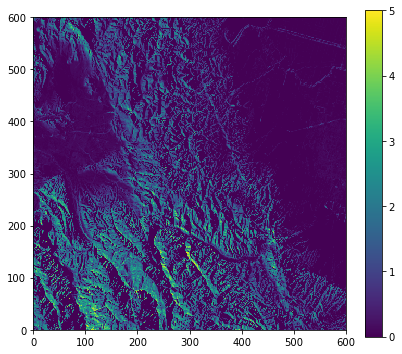

In [120]:
fig, ax = plt.subplots(figsize=(7,6))
cm = ax.pcolormesh(aa,vmin=0, vmax=5)
fig.colorbar(cm, ax=ax)
ax.set_aspect('equal')

In [95]:
w_compute_5m   = wspd*np.cos(slop_compute_5m  )*np.sin(aspe_compute_5m   - wdir)
w_compute_10m  = wspd*np.cos(slop_compute_10m )*np.sin(aspe_compute_10m  - wdir)
w_compute_20m  = wspd*np.cos(slop_compute_20m )*np.sin(aspe_compute_20m  - wdir)
w_compute_30m  = wspd*np.cos(slop_compute_30m )*np.sin(aspe_compute_30m  - wdir)
w_compute_50m  = wspd*np.cos(slop_compute_50m )*np.sin(aspe_compute_50m  - wdir)
w_compute_100m = wspd*np.cos(slop_compute_100m)*np.sin(aspe_compute_100m - wdir)

In [98]:
w_3dep_5m   = wspd*np.cos(np.deg2rad(slop_3dep_5m  ))*np.sin(np.deg2rad(aspe_3dep_5m   - wdir))
w_3dep_10m  = wspd*np.cos(np.deg2rad(slop_3dep_10m ))*np.sin(np.deg2rad(aspe_3dep_10m  - wdir))
w_3dep_20m  = wspd*np.cos(np.deg2rad(slop_3dep_20m ))*np.sin(np.deg2rad(aspe_3dep_20m  - wdir))
w_3dep_30m  = wspd*np.cos(np.deg2rad(slop_3dep_30m ))*np.sin(np.deg2rad(aspe_3dep_30m  - wdir))
w_3dep_50m  = wspd*np.cos(np.deg2rad(slop_3dep_50m ))*np.sin(np.deg2rad(aspe_3dep_50m  - wdir))
w_3dep_100m = wspd*np.cos(np.deg2rad(slop_3dep_100m))*np.sin(np.deg2rad(aspe_3dep_100m - wdir))

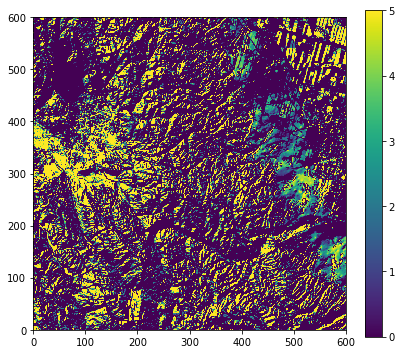

In [121]:
fig, ax = plt.subplots(figsize=(7,6))
cm = ax.pcolormesh(w_3dep_50m, vmin=0, vmax=5)
fig.colorbar(cm, ax=ax)
ax.set_aspect('equal')

# Plots

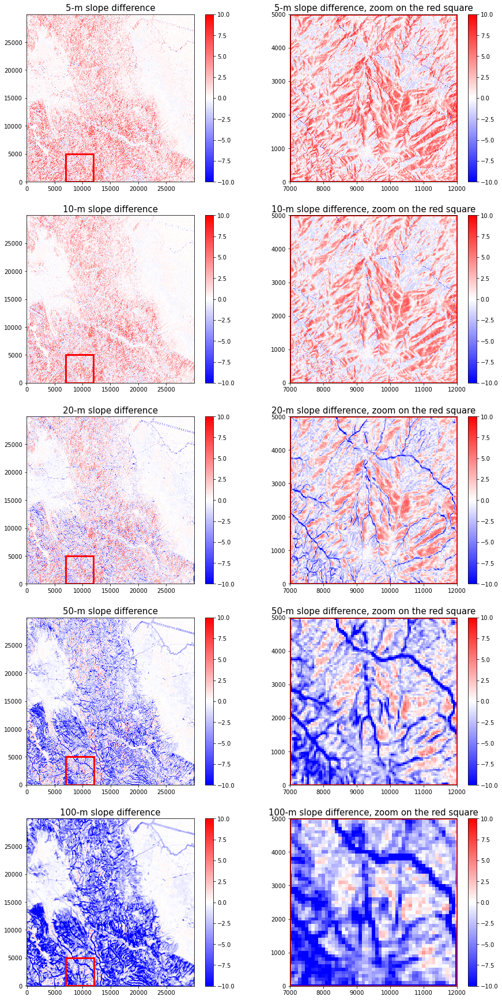

In [79]:
rows=5
cols=2
vminmax=10
fig, axs = plt.subplots(nrows=rows, ncols=cols, figsize=(7.5*cols,6.2*rows))
i=0; j=0

# 5m
cm = axs[i,j].pcolormesh(xx5,yy5,(slop_compute_5m-slop_3dep_5m).T, cmap='bwr', vmin=-vminmax, vmax=vminmax)
plt.colorbar(cm, ax=axs[i,j]) 
axs[i,j].set_title('5-m slope difference', fontsize=15); j=j+1
# 5m, zoom
cm = axs[i,j].pcolormesh(xx5,yy5,(slop_compute_5m-slop_3dep_5m).T, cmap='bwr', vmin=-vminmax, vmax=vminmax)
plt.colorbar(cm, ax=axs[i,j]) 
axs[i,j].set_ylim([0,5000]);  axs[i,j].set_xlim([7000, 12000])
axs[i,j].set_title('5-m slope difference, zoom on the red square', fontsize=15); i=i+1


# 10m
j=0
cm = axs[i,j].pcolormesh(xx10,yy10,(slop_compute_10m-slop_3dep_10m).T, cmap='bwr', vmin=-vminmax, vmax=vminmax)
plt.colorbar(cm, ax=axs[i,j]) 
axs[i,j].set_title('10-m slope difference', fontsize=15); j=j+1
# 10m, zoom
cm = axs[i,j].pcolormesh(xx10,yy10,(slop_compute_10m-slop_3dep_10m).T, cmap='bwr', vmin=-vminmax, vmax=vminmax)
plt.colorbar(cm, ax=axs[i,j]) 
axs[i,j].set_ylim([0,5000]);  axs[i,j].set_xlim([7000, 12000])
axs[i,j].set_title('10-m slope difference, zoom on the red square', fontsize=15); i=i+1


# 20m
j=0
cm = axs[i,j].pcolormesh(xx20,yy20,(slop_compute_20m-slop_3dep_20m).T, cmap='bwr', vmin=-vminmax, vmax=vminmax)
plt.colorbar(cm, ax=axs[i,j]) 
axs[i,j].set_title('20-m slope difference', fontsize=15); j=j+1
# 20m, zoom
cm = axs[i,j].pcolormesh(xx20,yy20,(slop_compute_20m-slop_3dep_20m).T, cmap='bwr', vmin=-vminmax, vmax=vminmax)
plt.colorbar(cm, ax=axs[i,j]) 
axs[i,j].set_ylim([0,5000]);  axs[i,j].set_xlim([7000, 12000])
axs[i,j].set_title('20-m slope difference, zoom on the red square', fontsize=15); i=i+1


# 50m
j=0
cm = axs[i,j].pcolormesh(xx50,yy50,(slop_compute_50m-slop_3dep_50m).T, cmap='bwr', vmin=-vminmax, vmax=vminmax)
plt.colorbar(cm, ax=axs[i,j]) 
axs[i,j].set_title('50-m slope difference', fontsize=15); j=j+1
# 50m, zoom
cm = axs[i,j].pcolormesh(xx50,yy50,(slop_compute_50m-slop_3dep_50m).T, cmap='bwr', vmin=-vminmax, vmax=vminmax)
plt.colorbar(cm, ax=axs[i,j]) 
axs[i,j].set_ylim([0,5000]);  axs[i,j].set_xlim([7000, 12000])
axs[i,j].set_title('50-m slope difference, zoom on the red square', fontsize=15); i=i+1


# 100m
j=0
cm = axs[i,j].pcolormesh(xx100,yy100,(slop_compute_100m-slop_3dep_100m).T, cmap='bwr', vmin=-vminmax, vmax=vminmax)
plt.colorbar(cm, ax=axs[i,j]) 
axs[i,j].set_title('100-m slope difference', fontsize=15); j=j+1
# 100m, zoom
cm = axs[i,j].pcolormesh(xx100,yy100,(slop_compute_100m-slop_3dep_100m).T, cmap='bwr', vmin=-vminmax, vmax=vminmax)
plt.colorbar(cm, ax=axs[i,j]) 
axs[i,j].set_ylim([0,5000]);  axs[i,j].set_xlim([7000, 12000])
axs[i,j].set_title('100-m slope difference, zoom on the red square', fontsize=15); i=i+1

for ax in axs.flatten():
    ax.add_patch(patches.Rectangle((7000, 0), 5000, 5000, linewidth=3, edgecolor='r', facecolor='none'))
    ax.set_aspect('equal')

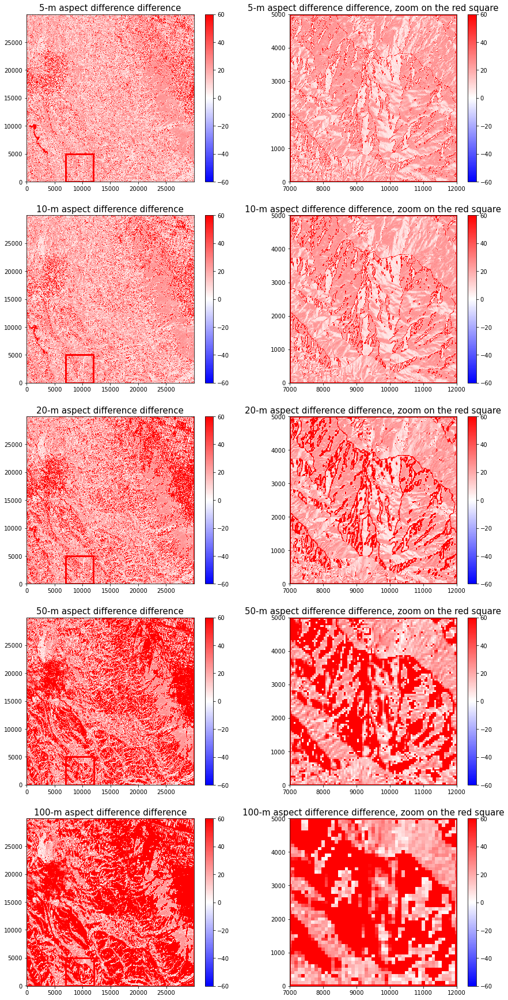

In [80]:
rows=5
cols=2
vminmax=60
fig, axs = plt.subplots(nrows=rows, ncols=cols, figsize=(7.5*cols,6.2*rows))
i=0; j=0

# 5m
cm = axs[i,j].pcolormesh(xx5,yy5,((aspe_compute_5m-aspe_3dep_5m)%360).T, cmap='bwr', vmin=-vminmax, vmax=vminmax)
plt.colorbar(cm, ax=axs[i,j]) 
axs[i,j].add_patch(patches.Rectangle((7000, 0), 5000, 5000, linewidth=3, edgecolor='r', facecolor='none'))
axs[i,j].set_title('5-m aspect difference difference', fontsize=15); j=j+1
# 5m, zoom
cm = axs[i,j].pcolormesh(xx5,yy5,((aspe_compute_5m-aspe_3dep_5m)%360).T, cmap='bwr', vmin=-vminmax, vmax=vminmax)
plt.colorbar(cm, ax=axs[i,j]) 
axs[i,j].add_patch(patches.Rectangle((7000, 0), 5000, 5000, linewidth=3, edgecolor='r', facecolor='none'))
axs[i,j].set_ylim([0,5000]);  axs[i,j].set_xlim([7000, 12000])
axs[i,j].set_title('5-m aspect difference difference, zoom on the red square', fontsize=15); i=i+1


# 10m
j=0
cm = axs[i,j].pcolormesh(xx10,yy10,((aspe_compute_10m-aspe_3dep_10m)%360).T, cmap='bwr', vmin=-vminmax, vmax=vminmax)
plt.colorbar(cm, ax=axs[i,j]) 
axs[i,j].add_patch(patches.Rectangle((7000, 0), 5000, 5000, linewidth=3, edgecolor='r', facecolor='none'))
axs[i,j].set_title('10-m aspect difference difference', fontsize=15); j=j+1
# 10m, zoom
cm = axs[i,j].pcolormesh(xx10,yy10,((aspe_compute_10m-aspe_3dep_10m)%360).T, cmap='bwr', vmin=-vminmax, vmax=vminmax)
plt.colorbar(cm, ax=axs[i,j]) 
axs[i,j].add_patch(patches.Rectangle((7000, 0), 5000, 5000, linewidth=3, edgecolor='r', facecolor='none'))
axs[i,j].set_ylim([0,5000]);  axs[i,j].set_xlim([7000, 12000])
axs[i,j].set_title('10-m aspect difference difference, zoom on the red square', fontsize=15); i=i+1


# 20m
j=0
cm = axs[i,j].pcolormesh(xx20,yy20,((aspe_compute_20m-aspe_3dep_20m)%360).T, cmap='bwr', vmin=-vminmax, vmax=vminmax)
plt.colorbar(cm, ax=axs[i,j]) 
axs[i,j].add_patch(patches.Rectangle((7000, 0), 5000, 5000, linewidth=3, edgecolor='r', facecolor='none'))
axs[i,j].set_title('20-m aspect difference difference', fontsize=15); j=j+1
# 20m, zoom
cm = axs[i,j].pcolormesh(xx20,yy20,((aspe_compute_20m-aspe_3dep_20m)%360).T, cmap='bwr', vmin=-vminmax, vmax=vminmax)
plt.colorbar(cm, ax=axs[i,j]) 
axs[i,j].add_patch(patches.Rectangle((7000, 0), 5000, 5000, linewidth=3, edgecolor='r', facecolor='none'))
axs[i,j].set_ylim([0,5000]);  axs[i,j].set_xlim([7000, 12000])
axs[i,j].set_title('20-m aspect difference difference, zoom on the red square', fontsize=15); i=i+1


# 50m
j=0
cm = axs[i,j].pcolormesh(xx50,yy50,((aspe_compute_50m-aspe_3dep_50m)%360).T, cmap='bwr', vmin=-vminmax, vmax=vminmax)
plt.colorbar(cm, ax=axs[i,j]) 
axs[i,j].add_patch(patches.Rectangle((7000, 0), 5000, 5000, linewidth=3, edgecolor='r', facecolor='none'))
axs[i,j].set_title('50-m aspect difference difference', fontsize=15); j=j+1
# 50m, zoom
cm = axs[i,j].pcolormesh(xx50,yy50,((aspe_compute_50m-aspe_3dep_50m)%360).T, cmap='bwr', vmin=-vminmax, vmax=vminmax)
plt.colorbar(cm, ax=axs[i,j]) 
axs[i,j].add_patch(patches.Rectangle((7000, 0), 5000, 5000, linewidth=3, edgecolor='r', facecolor='none'))
axs[i,j].set_ylim([0,5000]);  axs[i,j].set_xlim([7000, 12000])
axs[i,j].set_title('50-m aspect difference difference, zoom on the red square', fontsize=15); i=i+1


# 100m
j=0
cm = axs[i,j].pcolormesh(xx100,yy100,((aspe_compute_100m-aspe_3dep_100m)%360).T, cmap='bwr', vmin=-vminmax, vmax=vminmax)
plt.colorbar(cm, ax=axs[i,j]) 
axs[i,j].add_patch(patches.Rectangle((7000, 0), 5000, 5000, linewidth=3, edgecolor='r', facecolor='none'))
axs[i,j].set_title('100-m aspect difference difference', fontsize=15); j=j+1
# 100m, zoom
cm = axs[i,j].pcolormesh(xx100,yy100,((aspe_compute_100m-aspe_3dep_100m)%360).T, cmap='bwr', vmin=-vminmax, vmax=vminmax)
plt.colorbar(cm, ax=axs[i,j]) 
axs[i,j].add_patch(patches.Rectangle((7000, 0), 5000, 5000, linewidth=3, edgecolor='r', facecolor='none'))
axs[i,j].set_ylim([0,5000]);  axs[i,j].set_xlim([7000, 12000])
axs[i,j].set_title('100-m aspect difference difference, zoom on the red square', fontsize=15); i=i+1

for ax in axs.flatten():
    ax.add_patch(patches.Rectangle((7000, 0), 5000, 5000, linewidth=3, edgecolor='r', facecolor='none'))
    ax.set_aspect('equal')


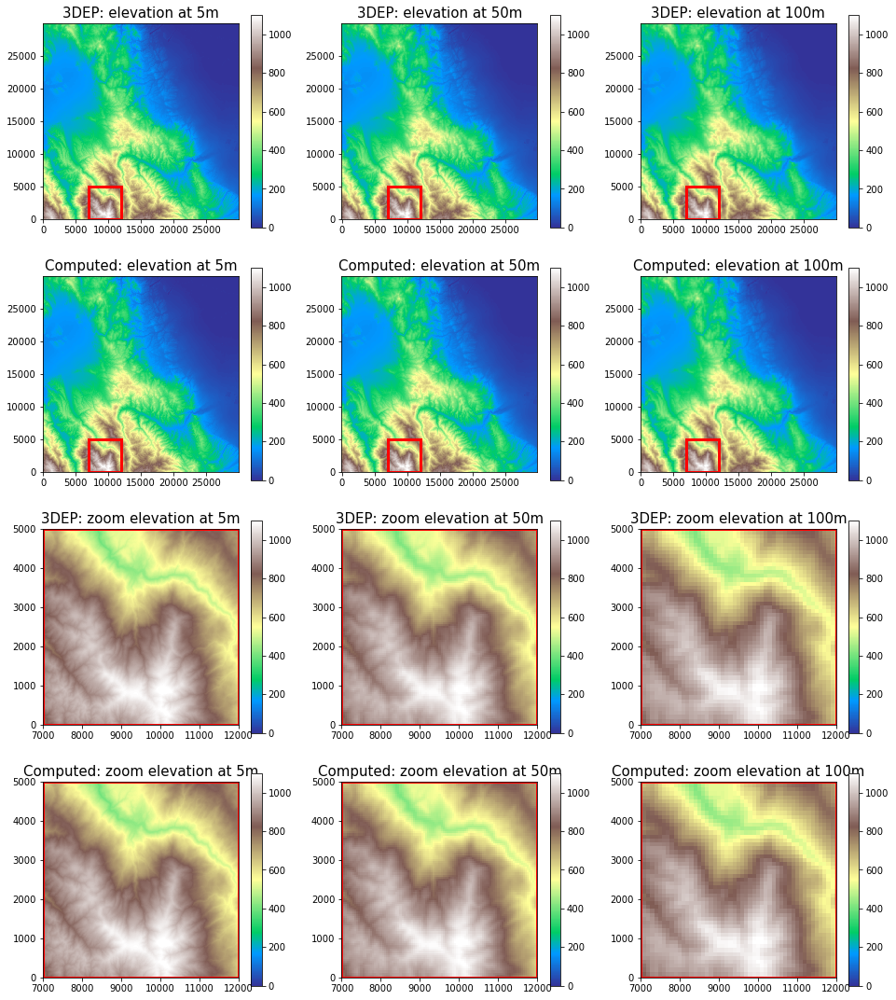

In [93]:
rows=4; cols=3
cmap='terrain'
vmin=0;  vmax=1100
vminmaxdiff = 1
fig, axs = plt.subplots(nrows=rows, ncols=cols, figsize=(4.5*cols,3.8*rows))
i=0; j=0

# 3DEP: elevation at 5m
cm = axs[i,j].pcolormesh(xx5, yy5, (elev_3dep_5m).T, cmap=cmap, vmin=vmin, vmax=vmax)
plt.colorbar(cm, ax=axs[i,j]) 
axs[i,j].set_title('3DEP: elevation at 5m', fontsize=15); j=j+1
# 3DEP: elevation at 50m
cm = axs[i,j].pcolormesh(xx50, yy50, (elev_3dep_50m).T, cmap=cmap, vmin=vmin, vmax=vmax)
plt.colorbar(cm, ax=axs[i,j]) 
axs[i,j].set_title('3DEP: elevation at 50m', fontsize=15); j=j+1
# 3DEP: elevation at 100m
cm = axs[i,j].pcolormesh(xx100, yy100, (elev_3dep_100m).T, cmap=cmap, vmin=vmin, vmax=vmax)
plt.colorbar(cm, ax=axs[i,j]) 
axs[i,j].set_title('3DEP: elevation at 100m', fontsize=15);  i=i+1; j=0


# Computed: elevation at 5m
cm = axs[i,j].pcolormesh(xx5, yy5, (elev_compute_5m).T, cmap=cmap, vmin=vmin, vmax=vmax)
plt.colorbar(cm, ax=axs[i,j])
axs[i,j].set_title('Computed: elevation at 5m', fontsize=15); j=j+1
# Computed: elevation at 50m
cm = axs[i,j].pcolormesh(xx50, yy50, (elev_compute_50m).T, cmap=cmap, vmin=vmin, vmax=vmax)
plt.colorbar(cm, ax=axs[i,j])
axs[i,j].set_title('Computed: elevation at 50m', fontsize=15); j=j+1
# Computed: elevation at 100m
cm = axs[i,j].pcolormesh(xx100, yy100, (elev_compute_100m).T, cmap=cmap, vmin=vmin, vmax=vmax)
plt.colorbar(cm, ax=axs[i,j])
axs[i,j].set_title('Computed: elevation at 100m', fontsize=15); i=i+1; j=0


# # Computed-3DEP: elevation at 5m
# cm = axs[i,j].pcolormesh(xx5, yy5, (elev_compute_5m-elev_3dep_5m).T, cmap='bwr', vmin=-vminmaxdiff, vmax=vminmaxdiff)
# plt.colorbar(cm, ax=axs[i,j])
# axs[i,j].set_title('Computed-3DEP: elevation at 5m', fontsize=15); j=j+1
# # Computed-3DEP: elevation at 50m
# cm = axs[i,j].pcolormesh(xx50, yy50, (elev_compute_50m-elev_3dep_50m).T, cmap='bwr', vmin=-vminmaxdiff, vmax=vminmaxdiff)
# plt.colorbar(cm, ax=axs[i,j])
# axs[i,j].set_title('Computed-3DEP: elevation at 50m', fontsize=15); j=j+1
# # Computed-3DEP: elevation at 100m
# cm = axs[i,j].pcolormesh(xx100, yy100, (elev_compute_100m-elev_3dep_100m).T, cmap='bwr', vmin=-vminmaxdiff, vmax=vminmaxdiff)
# plt.colorbar(cm, ax=axs[i,j])
# axs[i,j].set_title('Computed-3DEP: elevation at 100m', fontsize=15); i=i+1; j=0


# 3DEP: zoom elevation at 5m
cm = axs[i,j].pcolormesh(xx5, yy5, (elev_3dep_5m).T, cmap=cmap, vmin=vmin, vmax=vmax)
plt.colorbar(cm, ax=axs[i,j]) 
axs[i,j].set_ylim([0,5000]);  axs[i,j].set_xlim([7000, 12000])
axs[i,j].set_title('3DEP: zoom elevation at 5m', fontsize=15); j=j+1
# 3DEP: zoom elevation at 50m
cm = axs[i,j].pcolormesh(xx50, yy50, (elev_3dep_50m).T, cmap=cmap, vmin=vmin, vmax=vmax)
plt.colorbar(cm, ax=axs[i,j]) 
axs[i,j].set_ylim([0,5000]);  axs[i,j].set_xlim([7000, 12000])
axs[i,j].set_title('3DEP: zoom elevation at 50m', fontsize=15); j=j+1
# 3DEP: zoom elevation at 100m
cm = axs[i,j].pcolormesh(xx100, yy100, (elev_3dep_100m).T, cmap=cmap, vmin=vmin, vmax=vmax)
plt.colorbar(cm, ax=axs[i,j]) 
axs[i,j].set_ylim([0,5000]);  axs[i,j].set_xlim([7000, 12000])
axs[i,j].set_title('3DEP: zoom elevation at 100m', fontsize=15); i=i+1; j=0


# Computed: zoom elevation at 5m
cm = axs[i,j].pcolormesh(xx5, yy5, (elev_compute_5m).T, cmap=cmap, vmin=vmin, vmax=vmax)
plt.colorbar(cm, ax=axs[i,j])
axs[i,j].set_ylim([0,5000]);  axs[i,j].set_xlim([7000, 12000])
axs[i,j].set_title('Computed: zoom elevation at 5m', fontsize=15); j=j+1
# Computed: zoom elevation at 50m
cm = axs[i,j].pcolormesh(xx50, yy50, (elev_compute_50m).T, cmap=cmap, vmin=vmin, vmax=vmax)
plt.colorbar(cm, ax=axs[i,j])
axs[i,j].set_ylim([0,5000]);  axs[i,j].set_xlim([7000, 12000])
axs[i,j].set_title('Computed: zoom elevation at 50m', fontsize=15); j=j+1
# Computed: zoom elevation at 5m
cm = axs[i,j].pcolormesh(xx100, yy100, (elev_compute_100m).T, cmap=cmap, vmin=vmin, vmax=vmax)
plt.colorbar(cm, ax=axs[i,j])
axs[i,j].set_ylim([0,5000]);  axs[i,j].set_xlim([7000, 12000])
axs[i,j].set_title('Computed: zoom elevation at 100m', fontsize=15); i=i+1; j=0


# # Computed-3DEP: zoom elevation at 5m
# cm = axs[i,j].pcolormesh(xx5, yy5, (elev_compute_5m-elev_3dep_5m).T, cmap='bwr', vmin=-vminmaxdiff, vmax=vminmaxdiff)
# plt.colorbar(cm, ax=axs[i,j])
# axs[i,j].set_ylim([0,5000]);  axs[i,j].set_xlim([7000, 12000])
# axs[i,j].set_title('Computed-3DEP: zoom elevation at 5m', fontsize=15); j=j+1
# # Computed-3DEP: zoom elevation at 50m
# cm = axs[i,j].pcolormesh(xx50, yy50, (elev_compute_50m-elev_3dep_50m).T, cmap='bwr', vmin=-vminmaxdiff, vmax=vminmaxdiff)
# plt.colorbar(cm, ax=axs[i,j])
# axs[i,j].set_ylim([0,5000]);  axs[i,j].set_xlim([7000, 12000])
# axs[i,j].set_title('Computed-3DEP: zoom elevation at 50m', fontsize=15); j=j+1
# # Computed-3DEP: zoom elevation at 100m
# cm = axs[i,j].pcolormesh(xx100, yy100, (elev_compute_100m-elev_3dep_100m).T, cmap='bwr', vmin=-vminmaxdiff, vmax=vminmaxdiff)
# plt.colorbar(cm, ax=axs[i,j])
# axs[i,j].set_ylim([0,5000]);  axs[i,j].set_xlim([7000, 12000])
# axs[i,j].set_title('Computed-3DEP: zoom elevation at 100m', fontsize=15); i=i+1; j=0


for ax in axs.flatten():
	ax.add_patch(patches.Rectangle((7000, 0), 5000, 5000, linewidth=3, edgecolor='r', facecolor='none'))
	ax.set_aspect('equal')

fig.tight_layout()

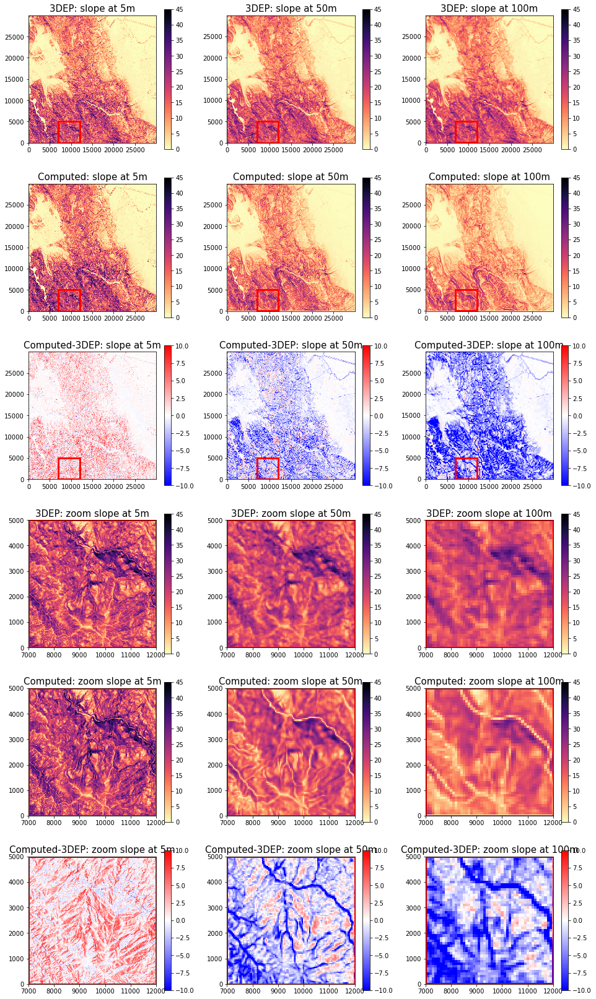

In [85]:
rows=6; cols=3
cmap='magma_r'
vmin=0;  vmax=45
vminmaxdiff = 10
fig, axs = plt.subplots(nrows=rows, ncols=cols, figsize=(4.5*cols,3.8*rows))
i=0; j=0

# 3DEP: slope at 5m
cm = axs[i,j].pcolormesh(xx5, yy5, (slop_3dep_5m).T, cmap=cmap, vmin=vmin, vmax=vmax)
plt.colorbar(cm, ax=axs[i,j]) 
axs[i,j].set_title('3DEP: slope at 5m', fontsize=15); j=j+1
# 3DEP: slope at 50m
cm = axs[i,j].pcolormesh(xx50, yy50, (slop_3dep_50m).T, cmap=cmap, vmin=vmin, vmax=vmax)
plt.colorbar(cm, ax=axs[i,j]) 
axs[i,j].set_title('3DEP: slope at 50m', fontsize=15); j=j+1
# 3DEP: slope at 100m
cm = axs[i,j].pcolormesh(xx100, yy100, (slop_3dep_100m).T, cmap=cmap, vmin=vmin, vmax=vmax)
plt.colorbar(cm, ax=axs[i,j]) 
axs[i,j].set_title('3DEP: slope at 100m', fontsize=15);  i=i+1; j=0


# Computed: slope at 5m
cm = axs[i,j].pcolormesh(xx5, yy5, (slop_compute_5m).T, cmap=cmap, vmin=vmin, vmax=vmax)
plt.colorbar(cm, ax=axs[i,j])
axs[i,j].set_title('Computed: slope at 5m', fontsize=15); j=j+1
# Computed: slope at 50m
cm = axs[i,j].pcolormesh(xx50, yy50, (slop_compute_50m).T, cmap=cmap, vmin=vmin, vmax=vmax)
plt.colorbar(cm, ax=axs[i,j])
axs[i,j].set_title('Computed: slope at 50m', fontsize=15); j=j+1
# Computed: slope at 100m
cm = axs[i,j].pcolormesh(xx100, yy100, (slop_compute_100m).T, cmap=cmap, vmin=vmin, vmax=vmax)
plt.colorbar(cm, ax=axs[i,j])
axs[i,j].set_title('Computed: slope at 100m', fontsize=15); i=i+1; j=0


# Computed-3DEP: slope at 5m
cm = axs[i,j].pcolormesh(xx5, yy5, (slop_compute_5m-slop_3dep_5m).T, cmap='bwr', vmin=-vminmaxdiff, vmax=vminmaxdiff)
plt.colorbar(cm, ax=axs[i,j])
axs[i,j].set_title('Computed-3DEP: slope at 5m', fontsize=15); j=j+1
# Computed-3DEP: slope at 50m
cm = axs[i,j].pcolormesh(xx50, yy50, (slop_compute_50m-slop_3dep_50m).T, cmap='bwr', vmin=-vminmaxdiff, vmax=vminmaxdiff)
plt.colorbar(cm, ax=axs[i,j])
axs[i,j].set_title('Computed-3DEP: slope at 50m', fontsize=15); j=j+1
# Computed-3DEP: slope at 100m
cm = axs[i,j].pcolormesh(xx100, yy100, (slop_compute_100m-slop_3dep_100m).T, cmap='bwr', vmin=-vminmaxdiff, vmax=vminmaxdiff)
plt.colorbar(cm, ax=axs[i,j])
axs[i,j].set_title('Computed-3DEP: slope at 100m', fontsize=15); i=i+1; j=0


# 3DEP: zoom slope at 5m
cm = axs[i,j].pcolormesh(xx5, yy5, (slop_3dep_5m).T, cmap=cmap, vmin=vmin, vmax=vmax)
plt.colorbar(cm, ax=axs[i,j]) 
axs[i,j].set_ylim([0,5000]);  axs[i,j].set_xlim([7000, 12000])
axs[i,j].set_title('3DEP: zoom slope at 5m', fontsize=15); j=j+1
# 3DEP: zoom slope at 50m
cm = axs[i,j].pcolormesh(xx50, yy50, (slop_3dep_50m).T, cmap=cmap, vmin=vmin, vmax=vmax)
plt.colorbar(cm, ax=axs[i,j]) 
axs[i,j].set_ylim([0,5000]);  axs[i,j].set_xlim([7000, 12000])
axs[i,j].set_title('3DEP: zoom slope at 50m', fontsize=15); j=j+1
# 3DEP: zoom slope at 100m
cm = axs[i,j].pcolormesh(xx100, yy100, (slop_3dep_100m).T, cmap=cmap, vmin=vmin, vmax=vmax)
plt.colorbar(cm, ax=axs[i,j]) 
axs[i,j].set_ylim([0,5000]);  axs[i,j].set_xlim([7000, 12000])
axs[i,j].set_title('3DEP: zoom slope at 100m', fontsize=15); i=i+1; j=0


# Computed: zoom slope at 5m
cm = axs[i,j].pcolormesh(xx5, yy5, (slop_compute_5m).T, cmap=cmap, vmin=vmin, vmax=vmax)
plt.colorbar(cm, ax=axs[i,j])
axs[i,j].set_ylim([0,5000]);  axs[i,j].set_xlim([7000, 12000])
axs[i,j].set_title('Computed: zoom slope at 5m', fontsize=15); j=j+1
# Computed: zoom slope at 50m
cm = axs[i,j].pcolormesh(xx50, yy50, (slop_compute_50m).T, cmap=cmap, vmin=vmin, vmax=vmax)
plt.colorbar(cm, ax=axs[i,j])
axs[i,j].set_ylim([0,5000]);  axs[i,j].set_xlim([7000, 12000])
axs[i,j].set_title('Computed: zoom slope at 50m', fontsize=15); j=j+1
# Computed: zoom slope at 5m
cm = axs[i,j].pcolormesh(xx100, yy100, (slop_compute_100m).T, cmap=cmap, vmin=vmin, vmax=vmax)
plt.colorbar(cm, ax=axs[i,j])
axs[i,j].set_ylim([0,5000]);  axs[i,j].set_xlim([7000, 12000])
axs[i,j].set_title('Computed: zoom slope at 100m', fontsize=15); i=i+1; j=0


# Computed-3DEP: slope at 5m
cm = axs[i,j].pcolormesh(xx5, yy5, (slop_compute_5m-slop_3dep_5m).T, cmap='bwr', vmin=-vminmaxdiff, vmax=vminmaxdiff)
plt.colorbar(cm, ax=axs[i,j])
axs[i,j].set_ylim([0,5000]);  axs[i,j].set_xlim([7000, 12000])
axs[i,j].set_title('Computed-3DEP: zoom slope at 5m', fontsize=15); j=j+1
# Computed-3DEP: slope at 50m
cm = axs[i,j].pcolormesh(xx50, yy50, (slop_compute_50m-slop_3dep_50m).T, cmap='bwr', vmin=-vminmaxdiff, vmax=vminmaxdiff)
plt.colorbar(cm, ax=axs[i,j])
axs[i,j].set_ylim([0,5000]);  axs[i,j].set_xlim([7000, 12000])
axs[i,j].set_title('Computed-3DEP: zoom slope at 50m', fontsize=15); j=j+1
# Computed-3DEP: slope at 100m
axs[i,j].set_ylim([0,5000]);  axs[i,j].set_xlim([7000, 12000])
cm = axs[i,j].pcolormesh(xx100, yy100, (slop_compute_100m-slop_3dep_100m).T, cmap='bwr', vmin=-vminmaxdiff, vmax=vminmaxdiff)
plt.colorbar(cm, ax=axs[i,j])
axs[i,j].set_title('Computed-3DEP: zoom slope at 100m', fontsize=15); i=i+1; j=0


for ax in axs.flatten():
	ax.add_patch(patches.Rectangle((7000, 0), 5000, 5000, linewidth=3, edgecolor='r', facecolor='none'))
	ax.set_aspect('equal')

fig.tight_layout()

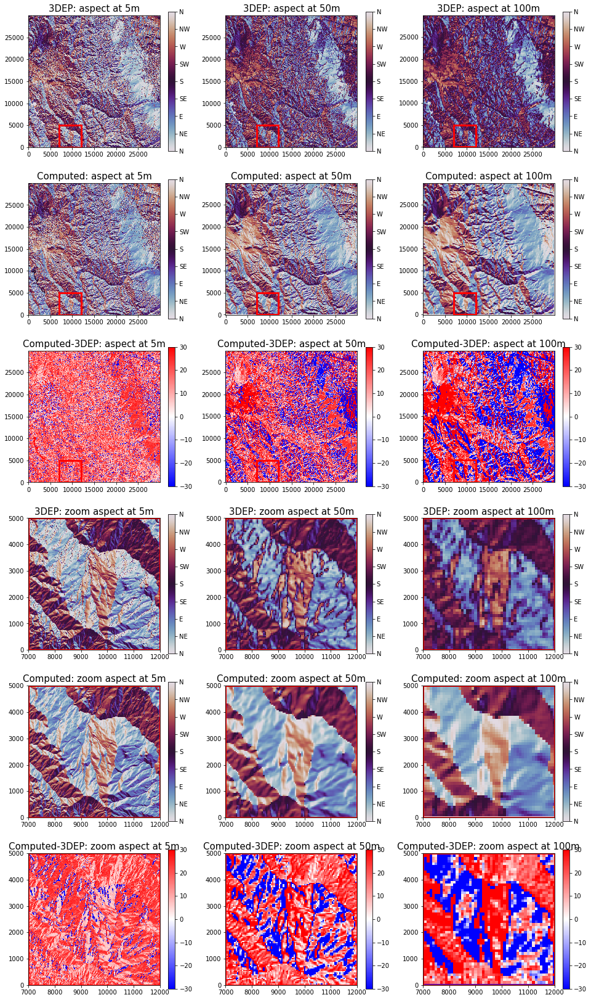

In [83]:
rows=6; cols=3
cmap='twilight'
vmin=0;  vmax=360
vminmaxdiff=30
fig, axs = plt.subplots(nrows=rows, ncols=cols, figsize=(4.5*cols,3.8*rows))
i=0; j=0

# 3DEP: aspect at 5m
cm = axs[i,j].pcolormesh(xx5, yy5, (aspe_3dep_5m).T, cmap=cmap, vmin=vmin, vmax=vmax)
cbar = plt.colorbar(cm, ax=axs[i,j]) 
cbar.ax.set_yticks([0,45,90,135,180,225,270,315,360])
cbar.ax.set_yticklabels(['N','NE','E','SE','S','SW','W','NW','N'])
axs[i,j].set_title('3DEP: aspect at 5m', fontsize=15); j=j+1
# 3DEP: aspect at 50m
cm = axs[i,j].pcolormesh(xx50, yy50, (aspe_3dep_50m).T, cmap=cmap, vmin=vmin, vmax=vmax)
cbar = plt.colorbar(cm, ax=axs[i,j]) 
cbar.ax.set_yticks([0,45,90,135,180,225,270,315,360])
cbar.ax.set_yticklabels(['N','NE','E','SE','S','SW','W','NW','N'])
axs[i,j].set_title('3DEP: aspect at 50m', fontsize=15); j=j+1
# 3DEP: aspect at 100m
cm = axs[i,j].pcolormesh(xx100, yy100, (aspe_3dep_100m).T, cmap=cmap, vmin=vmin, vmax=vmax)
cbar = plt.colorbar(cm, ax=axs[i,j]) 
cbar.ax.set_yticks([0,45,90,135,180,225,270,315,360])
cbar.ax.set_yticklabels(['N','NE','E','SE','S','SW','W','NW','N'])
axs[i,j].set_title('3DEP: aspect at 100m', fontsize=15);  i=i+1; j=0


# Computed: aspect at 5m
cm = axs[i,j].pcolormesh(xx5, yy5, (aspe_compute_5m).T, cmap=cmap, vmin=vmin, vmax=vmax)
cbar = plt.colorbar(cm, ax=axs[i,j])
cbar.ax.set_yticks([0,45,90,135,180,225,270,315,360])
cbar.ax.set_yticklabels(['N','NE','E','SE','S','SW','W','NW','N'])
axs[i,j].set_title('Computed: aspect at 5m', fontsize=15); j=j+1
# Computed: aspect at 50m
cm = axs[i,j].pcolormesh(xx50, yy50, (aspe_compute_50m).T, cmap=cmap, vmin=vmin, vmax=vmax)
cbar = plt.colorbar(cm, ax=axs[i,j])
cbar.ax.set_yticks([0,45,90,135,180,225,270,315,360])
cbar.ax.set_yticklabels(['N','NE','E','SE','S','SW','W','NW','N'])
axs[i,j].set_title('Computed: aspect at 50m', fontsize=15); j=j+1
# Computed: aspect at 100m
cm = axs[i,j].pcolormesh(xx100, yy100, (aspe_compute_100m).T, cmap=cmap, vmin=vmin, vmax=vmax)
cbar = plt.colorbar(cm, ax=axs[i,j])
cbar.ax.set_yticks([0,45,90,135,180,225,270,315,360])
cbar.ax.set_yticklabels(['N','NE','E','SE','S','SW','W','NW','N'])
axs[i,j].set_title('Computed: aspect at 100m', fontsize=15); i=i+1; j=0


# Computed-3DEP: aspect at 5m
cm = axs[i,j].pcolormesh(xx5, yy5, (aspe_compute_5m-aspe_3dep_5m).T, cmap='bwr', vmin=-vminmaxdiff, vmax=vminmaxdiff)
cbar = plt.colorbar(cm, ax=axs[i,j])
axs[i,j].set_title('Computed-3DEP: aspect at 5m', fontsize=15); j=j+1
# Computed-3DEP: aspect at 50m
cm = axs[i,j].pcolormesh(xx50, yy50, (aspe_compute_50m-aspe_3dep_50m).T, cmap='bwr', vmin=-vminmaxdiff, vmax=vminmaxdiff)
cbar = plt.colorbar(cm, ax=axs[i,j])
axs[i,j].set_title('Computed-3DEP: aspect at 50m', fontsize=15); j=j+1
# Computed-3DEP: aspect at 100m
cm = axs[i,j].pcolormesh(xx100, yy100, (aspe_compute_100m-aspe_3dep_100m).T, cmap='bwr', vmin=-vminmaxdiff, vmax=vminmaxdiff)
cbar = plt.colorbar(cm, ax=axs[i,j])
axs[i,j].set_title('Computed-3DEP: aspect at 100m', fontsize=15); i=i+1; j=0


# 3DEP: zoom aspect at 5m
cm = axs[i,j].pcolormesh(xx5, yy5, (aspe_3dep_5m).T, cmap=cmap, vmin=vmin, vmax=vmax)
cbar = plt.colorbar(cm, ax=axs[i,j]) 
cbar.ax.set_yticks([0,45,90,135,180,225,270,315,360])
cbar.ax.set_yticklabels(['N','NE','E','SE','S','SW','W','NW','N'])
axs[i,j].set_ylim([0,5000]);  axs[i,j].set_xlim([7000, 12000])
axs[i,j].set_title('3DEP: zoom aspect at 5m', fontsize=15); j=j+1
# 3DEP: zoom aspect at 50m
cm = axs[i,j].pcolormesh(xx50, yy50, (aspe_3dep_50m).T, cmap=cmap, vmin=vmin, vmax=vmax)
cbar = plt.colorbar(cm, ax=axs[i,j]) 
cbar.ax.set_yticks([0,45,90,135,180,225,270,315,360])
cbar.ax.set_yticklabels(['N','NE','E','SE','S','SW','W','NW','N'])
axs[i,j].set_ylim([0,5000]);  axs[i,j].set_xlim([7000, 12000])
axs[i,j].set_title('3DEP: zoom aspect at 50m', fontsize=15); j=j+1
# 3DEP: zoom aspect at 100m
cm = axs[i,j].pcolormesh(xx100, yy100, (aspe_3dep_100m).T, cmap=cmap, vmin=vmin, vmax=vmax)
cbar = plt.colorbar(cm, ax=axs[i,j]) 
cbar.ax.set_yticks([0,45,90,135,180,225,270,315,360])
cbar.ax.set_yticklabels(['N','NE','E','SE','S','SW','W','NW','N'])
axs[i,j].set_ylim([0,5000]);  axs[i,j].set_xlim([7000, 12000])
axs[i,j].set_title('3DEP: zoom aspect at 100m', fontsize=15); i=i+1; j=0


# Computed: zoom aspect at 5m
cm = axs[i,j].pcolormesh(xx5, yy5, (aspe_compute_5m).T, cmap=cmap, vmin=vmin, vmax=vmax)
cbar = plt.colorbar(cm, ax=axs[i,j])
cbar.ax.set_yticks([0,45,90,135,180,225,270,315,360])
cbar.ax.set_yticklabels(['N','NE','E','SE','S','SW','W','NW','N'])
axs[i,j].set_ylim([0,5000]);  axs[i,j].set_xlim([7000, 12000])
axs[i,j].set_title('Computed: zoom aspect at 5m', fontsize=15); j=j+1
# Computed: zoom aspect at 50m
cm = axs[i,j].pcolormesh(xx50, yy50, (aspe_compute_50m).T, cmap=cmap, vmin=vmin, vmax=vmax)
cbar = plt.colorbar(cm, ax=axs[i,j])
cbar.ax.set_yticks([0,45,90,135,180,225,270,315,360])
cbar.ax.set_yticklabels(['N','NE','E','SE','S','SW','W','NW','N'])
axs[i,j].set_ylim([0,5000]);  axs[i,j].set_xlim([7000, 12000])
axs[i,j].set_title('Computed: zoom aspect at 50m', fontsize=15); j=j+1
# Computed: zoom aspect at 5m
cm = axs[i,j].pcolormesh(xx100, yy100, (aspe_compute_100m).T, cmap=cmap, vmin=vmin, vmax=vmax)
cbar = plt.colorbar(cm, ax=axs[i,j])
cbar.ax.set_yticks([0,45,90,135,180,225,270,315,360])
cbar.ax.set_yticklabels(['N','NE','E','SE','S','SW','W','NW','N'])
axs[i,j].set_ylim([0,5000]);  axs[i,j].set_xlim([7000, 12000])
axs[i,j].set_title('Computed: zoom aspect at 100m', fontsize=15); i=i+1; j=0


# Computed-3DEP: aspect at 5m
cm = axs[i,j].pcolormesh(xx5, yy5, (aspe_compute_5m-aspe_3dep_5m).T, cmap='bwr', vmin=-vminmaxdiff, vmax=vminmaxdiff)
cbar = plt.colorbar(cm, ax=axs[i,j])
axs[i,j].set_ylim([0,5000]);  axs[i,j].set_xlim([7000, 12000])
axs[i,j].set_title('Computed-3DEP: zoom aspect at 5m', fontsize=15); j=j+1
# Computed-3DEP: aspect at 50m
cm = axs[i,j].pcolormesh(xx50, yy50, (aspe_compute_50m-aspe_3dep_50m).T, cmap='bwr', vmin=-vminmaxdiff, vmax=vminmaxdiff)
cbar = plt.colorbar(cm, ax=axs[i,j])
axs[i,j].set_ylim([0,5000]);  axs[i,j].set_xlim([7000, 12000])
axs[i,j].set_title('Computed-3DEP: zoom aspect at 50m', fontsize=15); j=j+1
# Computed-3DEP: aspect at 100m
cm = axs[i,j].pcolormesh(xx100, yy100, (aspe_compute_100m-aspe_3dep_100m).T, cmap='bwr', vmin=-vminmaxdiff, vmax=vminmaxdiff)
cbar = plt.colorbar(cm, ax=axs[i,j])
axs[i,j].set_ylim([0,5000]);  axs[i,j].set_xlim([7000, 12000])
axs[i,j].set_title('Computed-3DEP: zoom aspect at 100m', fontsize=15); i=i+1; j=0


for ax in axs.flatten():
    ax.add_patch(patches.Rectangle((7000, 0), 5000, 5000, linewidth=3, edgecolor='r', facecolor='none'))
    ax.set_aspect('equal')

fig.tight_layout()

## 5 m resolution, computed quantities

Plotting updraft fields..
Manually computing aspect..


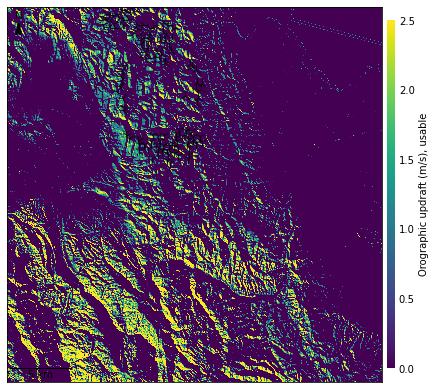

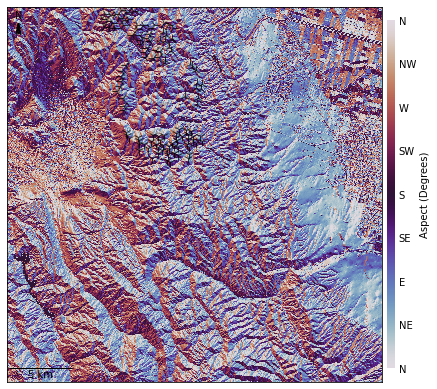

In [60]:
altpass_sim_original_compute_5m.plot_updrafts(show=True, apply_threshold=True, plot='pcolormesh',vmax=vmax)
altpass_sim_original_compute_5m.plot_terrain_aspect(show=True, plot='pcolormesh')
#altpass_sim_original_compute_5m.plot_terrain_slope(show=True, plot='pcolormesh')

## 10 m resolution, computed quantities

Manually computing slope..


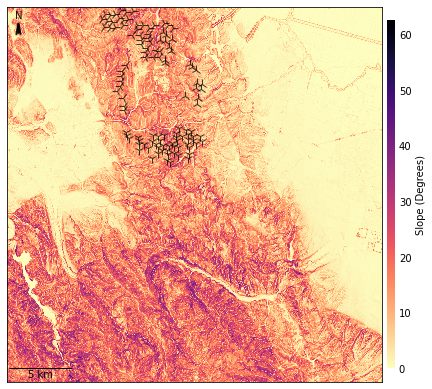

In [67]:
#altpass_sim_original_compute_10m.plot_updrafts(show=True, apply_threshold=True, plot='pcolormesh',vmax=vmax)
#altpass_sim_original_compute_10m.plot_terrain_aspect(show=True, plot='pcolormesh')
altpass_sim_original_compute_10m.plot_terrain_slope(show=True, plot='pcolormesh')

## 20 m resolution, computed quantities

Manually computing slope..


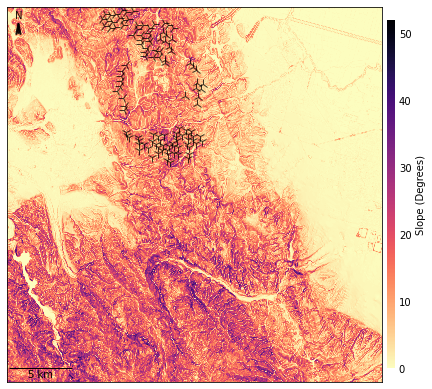

In [68]:
#altpass_sim_original_compute_20m.plot_updrafts(show=True, apply_threshold=False, plot='pcolormesh',vmax=vmax)
#altpass_sim_original_compute_20m.plot_terrain_aspect(show=True, plot='pcolormesh')
altpass_sim_original_compute_20m.plot_terrain_slope(show=True, plot='pcolormesh')

## 30 m resolution, computed quantities

Manually computing slope..


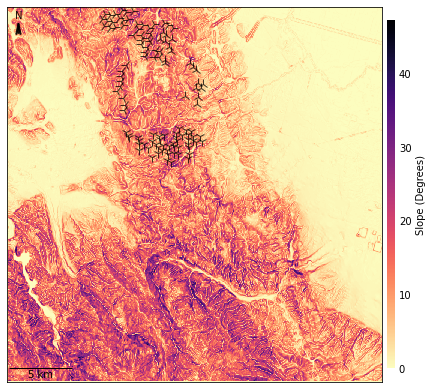

In [69]:
#altpass_sim_original_compute_30m.plot_updrafts(show=True, apply_threshold=False, plot='pcolormesh',vmax=vmax)
#altpass_sim_original_compute_30m.plot_terrain_aspect(show=True, plot='pcolormesh')
altpass_sim_original_compute_30m.plot_terrain_slope(show=True, plot='pcolormesh')

## 50 m resolution, computed quantities

Plotting updraft fields..
Manually computing aspect..


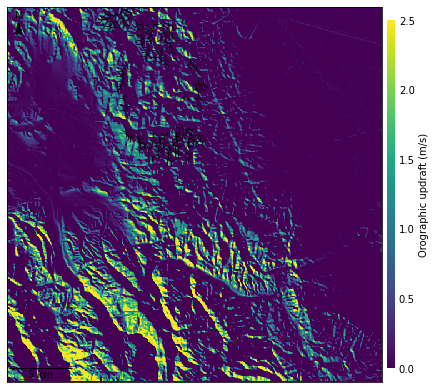

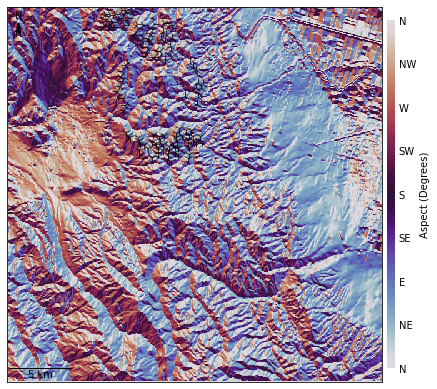

In [26]:
altpass_sim_original_compute_50m.plot_updrafts(show=True, apply_threshold=False, plot='pcolormesh',vmax=vmax)
altpass_sim_original_compute_50m.plot_terrain_aspect(show=True, plot='pcolormesh')
#altpass_sim_original_compute_50m.plot_terrain_slope(show=True, plot='pcolormesh')

## 100 m resolution, computed quantities

Plotting updraft fields..
Manually computing aspect..


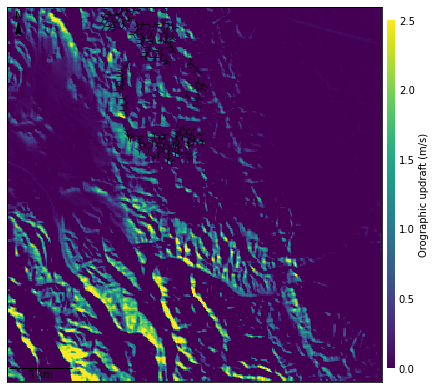

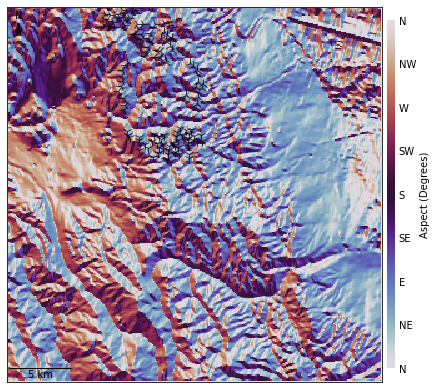

In [27]:
altpass_sim_original_compute_100m.plot_updrafts(show=True, apply_threshold=False, plot='pcolormesh',vmax=vmax)
altpass_sim_original_compute_100m.plot_terrain_aspect(show=True, plot='pcolormesh')
#altpass_sim_original_compute_100m.plot_terrain_slope(show=True, plot='pcolormesh')

## 5 m resolution, 3DEP quantities

Plotting updraft fields..


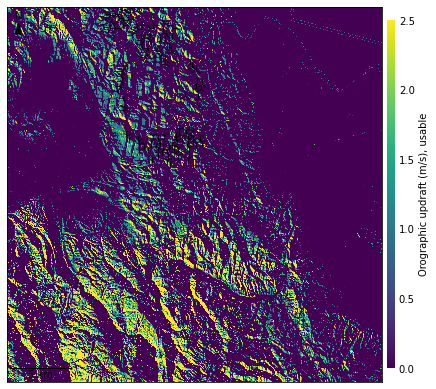

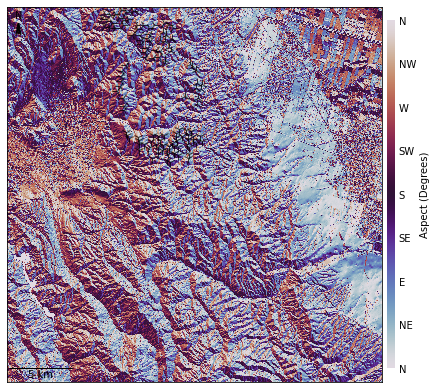

In [61]:
altpass_sim_original_3dep_5m.plot_updrafts(show=True, apply_threshold=True, plot='pcolormesh',vmax=vmax)
altpass_sim_original_3dep_5m.plot_terrain_aspect(show=True, plot='pcolormesh')
#altpass_sim_original_3dep_5m.plot_terrain_slope(show=True, plot='pcolormesh')

## 10 m resolution, 3DEP quantities

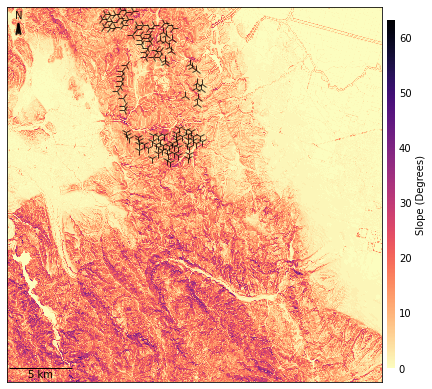

In [70]:
#altpass_sim_original_3dep_10m.plot_updrafts(show=True, apply_threshold=True, plot='pcolormesh',vmax=vmax)
#altpass_sim_original_3dep_10m.plot_terrain_aspect(show=True, plot='pcolormesh')
altpass_sim_original_3dep_10m.plot_terrain_slope(show=True, plot='pcolormesh')

## 20 m resolution, 3DEP quantities

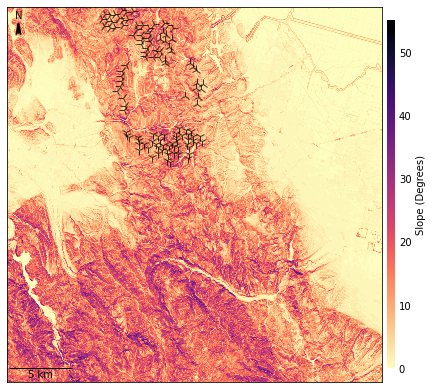

In [71]:
#altpass_sim_original_3dep_20m.plot_updrafts(show=True, apply_threshold=True, plot='pcolormesh',vmax=vmax)
#altpass_sim_original_3dep_20m.plot_terrain_aspect(show=True, plot='pcolormesh')
altpass_sim_original_3dep_20m.plot_terrain_slope(show=True, plot='pcolormesh')

## 30 m resolution, 3DEP quantities

Plotting updraft fields..


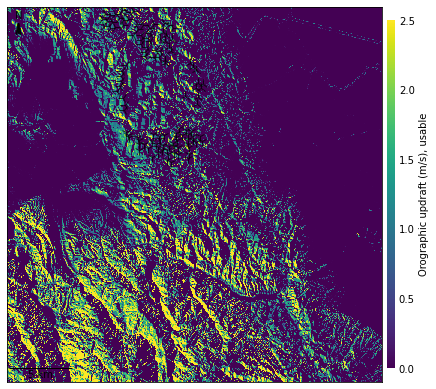

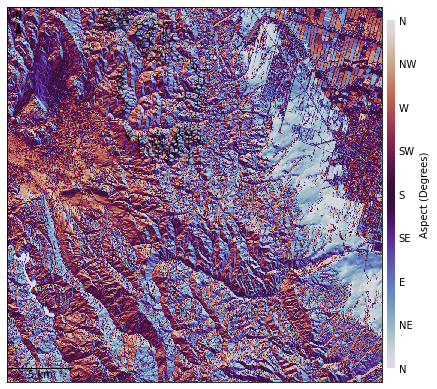

In [47]:
altpass_sim_original_3dep_30m.plot_updrafts(show=True, apply_threshold=True, plot='pcolormesh',vmax=vmax)
altpass_sim_original_3dep_30m.plot_terrain_aspect(show=True, plot='pcolormesh')
#altpass_sim_original_3dep_30m.plot_terrain_slope(show=True, plot='pcolormesh')

## 50 m resolution, 3DEP quantities

Plotting updraft fields..
Found orographic updraft s8d225thInt2_orograph_originalModel. Loading it...


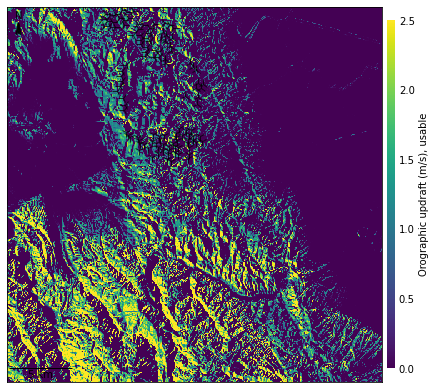

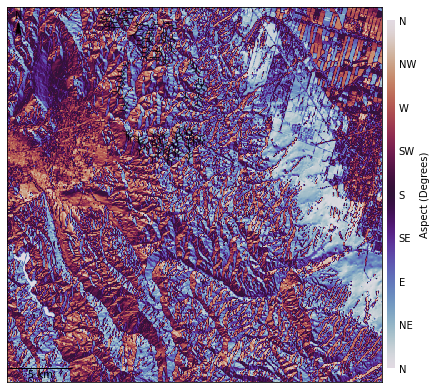

In [133]:
altpass_sim_original_3dep_50m_2res.plot_updrafts(show=True, apply_threshold=True, plot='pcolormesh',vmax=vmax)
altpass_sim_original_3dep_50m_2res.plot_terrain_aspect(show=True, plot='pcolormesh')
#altpass_sim_original_3dep_50m.plot_terrain_slope(show=True, plot='pcolormesh')

Plotting updraft fields..


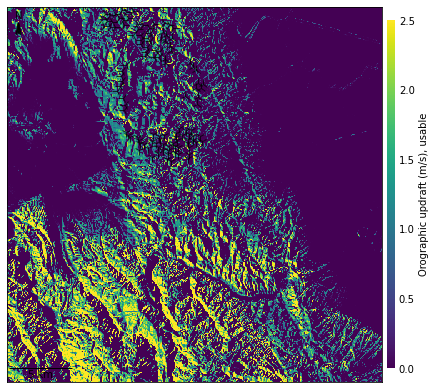

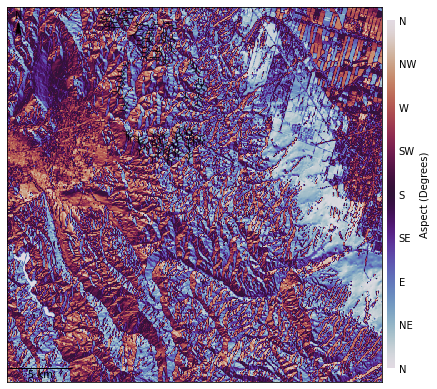

In [34]:
altpass_sim_original_3dep_50m.plot_updrafts(show=True, apply_threshold=True, plot='pcolormesh',vmax=vmax)
altpass_sim_original_3dep_50m.plot_terrain_aspect(show=True, plot='pcolormesh')
#altpass_sim_original_3dep_50m.plot_terrain_slope(show=True, plot='pcolormesh')

## 100 m resolution, 3DEP quantities

Plotting updraft fields..


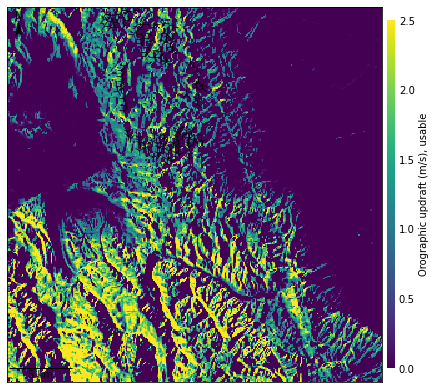

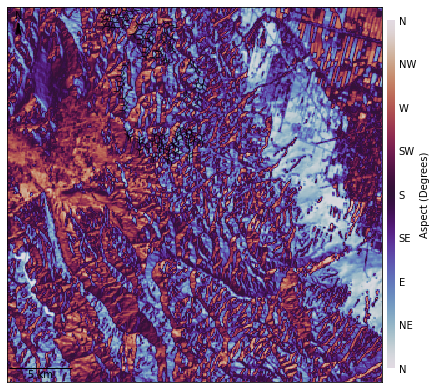

In [35]:
altpass_sim_original_3dep_100m.plot_updrafts(show=True, apply_threshold=True, plot='pcolormesh',vmax=vmax)
altpass_sim_original_3dep_100m.plot_terrain_aspect(show=True, plot='pcolormesh')
#altpass_sim_original_3dep_100m.plot_terrain_slope(show=True, plot='pcolormesh')

# Compare tracks

## 20 m resolution, computed quantities

Plotting simulated tracks..


(<Figure size 576x576 with 1 Axes>, <AxesSubplot:>)

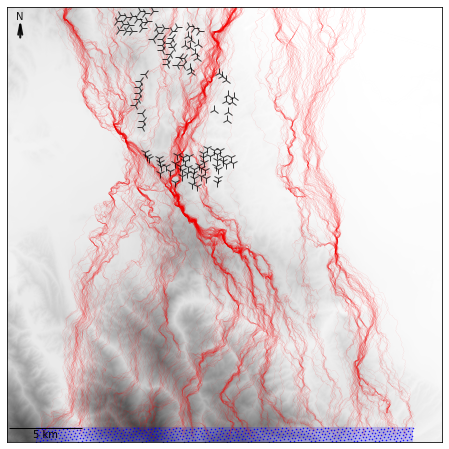

In [65]:
altpass_sim_original_compute_20m.plot_simulated_tracks_altamont(show=True)

## 30 m resolution, computed quantities

Plotting simulated tracks..


(<Figure size 576x576 with 1 Axes>, <AxesSubplot:>)

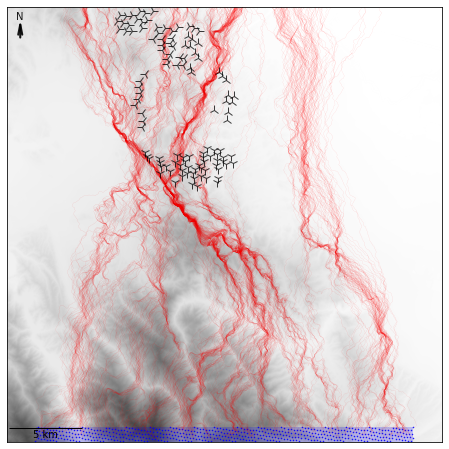

In [49]:
altpass_sim_original_compute_30m.plot_simulated_tracks_altamont(show=True)

## 50 m resolution, computed quantities

Plotting simulated tracks..


(<Figure size 576x576 with 1 Axes>, <AxesSubplot:>)

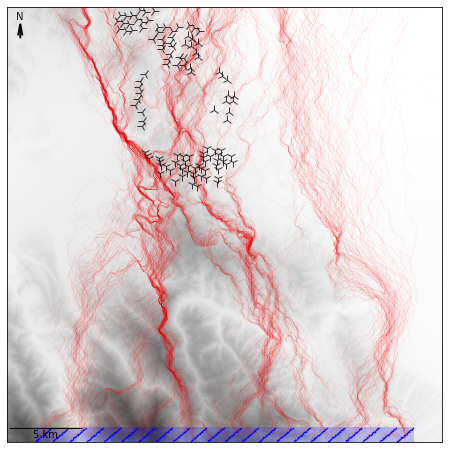

In [31]:
altpass_sim_original_compute_50m.plot_simulated_tracks_altamont(show=True)

## 100 m resolution, computed quantities

Plotting simulated tracks..


(<Figure size 576x576 with 1 Axes>, <AxesSubplot:>)

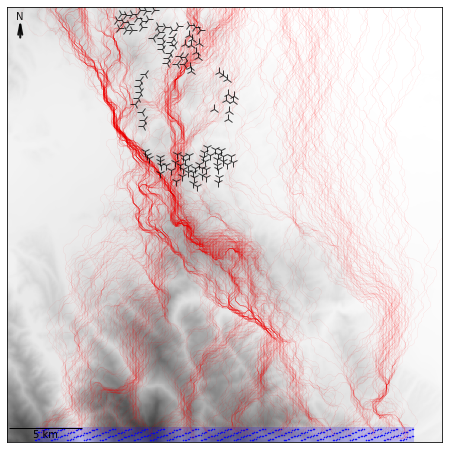

In [32]:
altpass_sim_original_compute_100m.plot_simulated_tracks_altamont(show=True)

## 20 m resolution, 3DEP quantities

Plotting simulated tracks..


(<Figure size 576x576 with 1 Axes>, <AxesSubplot:>)

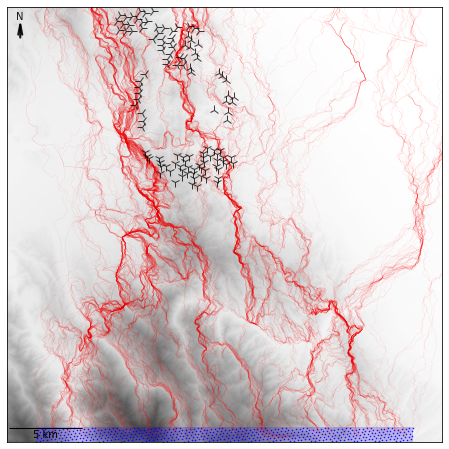

In [56]:
altpass_sim_original_3dep_20m.plot_simulated_tracks_altamont(show=True)

## 30 m resolution, 3DEP quantities

Plotting simulated tracks..


(<Figure size 576x576 with 1 Axes>, <AxesSubplot:>)

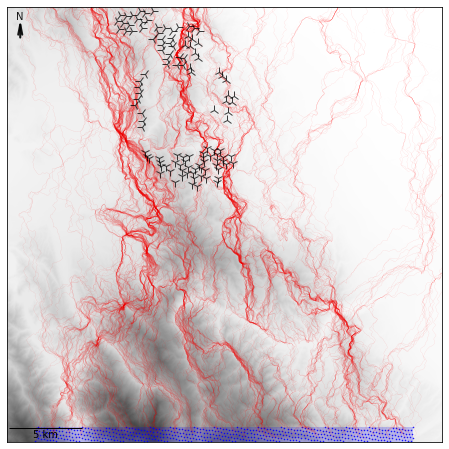

In [50]:
altpass_sim_original_3dep_30m.plot_simulated_tracks_altamont(show=True)

## 50 m resolution, 3DEP quantities

Plotting simulated tracks..


(<Figure size 576x576 with 1 Axes>, <AxesSubplot:>)

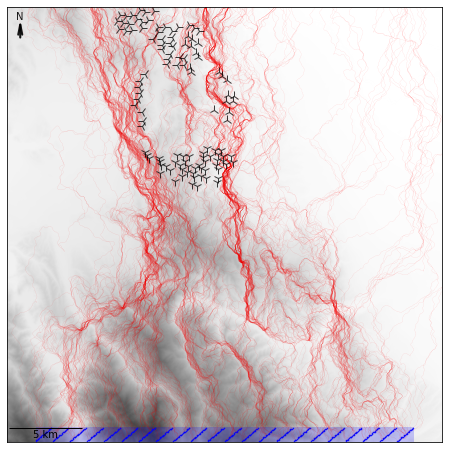

In [20]:
altpass_sim_original_3dep_50m.plot_simulated_tracks_altamont(show=True)

## 100 m resolution, 3DEP quantities

Plotting simulated tracks..


(<Figure size 576x576 with 1 Axes>, <AxesSubplot:>)

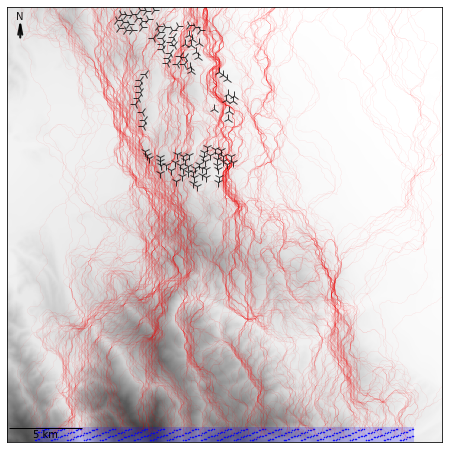

In [21]:
altpass_sim_original_3dep_100m.plot_simulated_tracks_altamont(show=True)

# Plot presence density maps

## 20 m resolution, computed quantities

Plotting presence density map..


(7468.474401077145, 19448.474401077143)

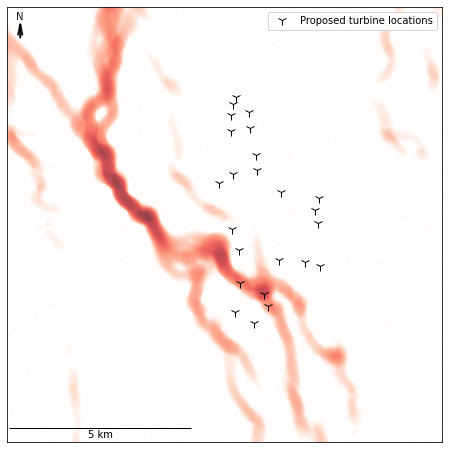

In [66]:
# plot the presence density map
fig, ax, _ = altpass_sim_original_compute_20m.plot_presence_map_altamont(show=True, radius=200., )
ax.plot(turb_xlocs, turb_ylocs, '1k', markersize=10, label='Proposed turbine locations')
ax.legend()
xlims = ax.get_xlim(); ylims = ax.get_ylim()
ax.set_xlim([xlims[0]+9000, xlims[1]-9000]);  ax.set_ylim([ylims[0]+9000, ylims[1]-9000])

## 30 m resolution, computed quantities

Plotting presence density map..


(7468.474401077145, 19438.474401077143)

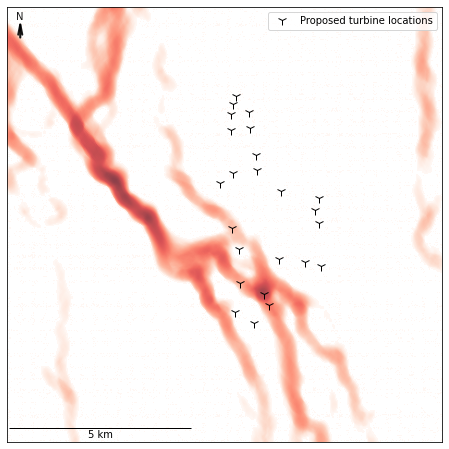

In [51]:
# plot the presence density map
fig, ax, _ = altpass_sim_original_compute_30m.plot_presence_map_altamont(show=True, radius=200., )
ax.plot(turb_xlocs, turb_ylocs, '1k', markersize=10, label='Proposed turbine locations')
ax.legend()
xlims = ax.get_xlim(); ylims = ax.get_ylim()
ax.set_xlim([xlims[0]+9000, xlims[1]-9000]);  ax.set_ylim([ylims[0]+9000, ylims[1]-9000])

## 50 m resolution, computed quantities

Plotting presence density map..


(7468.474401077145, 19418.474401077143)

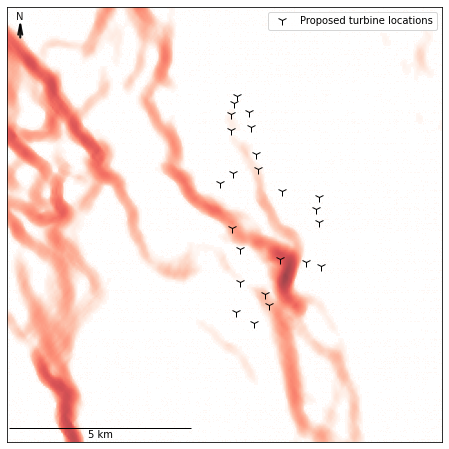

In [40]:
# plot the presence density map
fig, ax, _ = altpass_sim_original_compute_50m.plot_presence_map_altamont(show=True, radius=200., )
ax.plot(turb_xlocs, turb_ylocs, '1k', markersize=10, label='Proposed turbine locations')
ax.legend()
xlims = ax.get_xlim(); ylims = ax.get_ylim()
ax.set_xlim([xlims[0]+9000, xlims[1]-9000]);  ax.set_ylim([ylims[0]+9000, ylims[1]-9000])

## 100 m resolution, computed quantities

Plotting presence density map..


(7468.474401077145, 19368.474401077143)

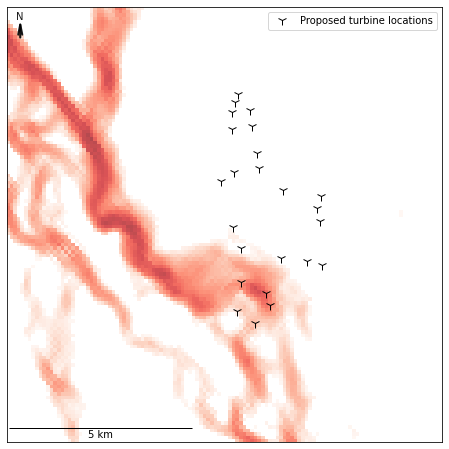

In [41]:
# plot the presence density map
fig, ax, _ = altpass_sim_original_compute_100m.plot_presence_map_altamont(show=True, radius=200., )
ax.plot(turb_xlocs, turb_ylocs, '1k', markersize=10, label='Proposed turbine locations')
ax.legend()
xlims = ax.get_xlim(); ylims = ax.get_ylim()
ax.set_xlim([xlims[0]+9000, xlims[1]-9000]);  ax.set_ylim([ylims[0]+9000, ylims[1]-9000])

## 20 m resolution, 3DEP quantities

Plotting presence density map..


(7468.474401077145, 19448.474401077143)

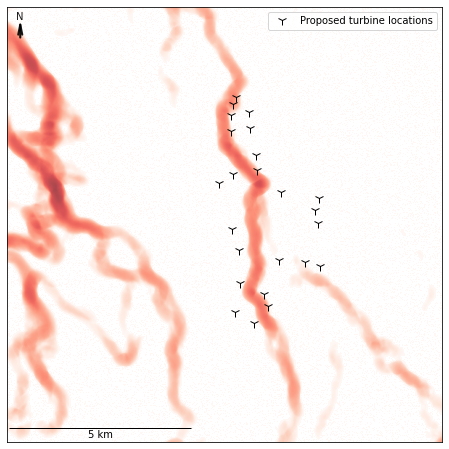

In [57]:
# plot the presence density map
fig, ax, _ = altpass_sim_original_3dep_20m.plot_presence_map_altamont(show=True, radius=200., )
ax.plot(turb_xlocs, turb_ylocs, '1k', markersize=10, label='Proposed turbine locations')
ax.legend()
xlims = ax.get_xlim(); ylims = ax.get_ylim()
ax.set_xlim([xlims[0]+9000, xlims[1]-9000]);  ax.set_ylim([ylims[0]+9000, ylims[1]-9000])

## 30 m resolution, 3DEP quantities

Plotting presence density map..


(7468.474401077145, 19438.474401077143)

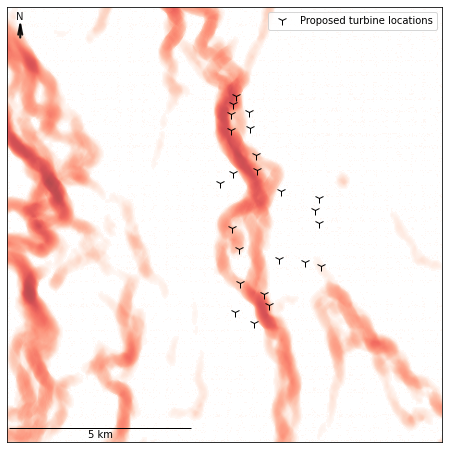

In [52]:
# plot the presence density map
fig, ax, _ = altpass_sim_original_3dep_30m.plot_presence_map_altamont(show=True, radius=200., )
ax.plot(turb_xlocs, turb_ylocs, '1k', markersize=10, label='Proposed turbine locations')
ax.legend()
xlims = ax.get_xlim(); ylims = ax.get_ylim()
ax.set_xlim([xlims[0]+9000, xlims[1]-9000]);  ax.set_ylim([ylims[0]+9000, ylims[1]-9000])

## 50 m resolution, 3DEP quantities

Plotting presence density map..


(7468.474401077145, 19418.474401077143)

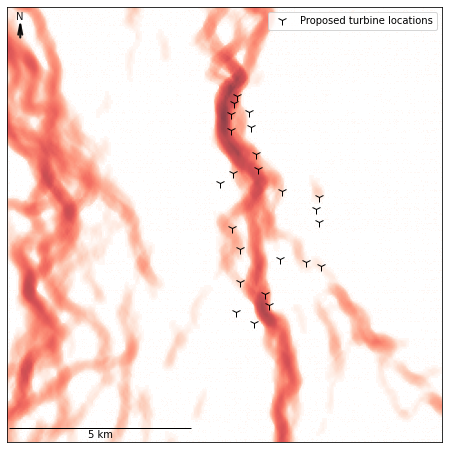

In [36]:
# plot the presence density map
fig, ax, _ = altpass_sim_original_3dep_50m.plot_presence_map_altamont(show=True, radius=200., )
ax.plot(turb_xlocs, turb_ylocs, '1k', markersize=10, label='Proposed turbine locations')
ax.legend()
xlims = ax.get_xlim(); ylims = ax.get_ylim()
ax.set_xlim([xlims[0]+9000, xlims[1]-9000]);  ax.set_ylim([ylims[0]+9000, ylims[1]-9000])

## 100 m resolution, 3DEP quantities

Plotting presence density map..


(7468.474401077145, 19368.474401077143)

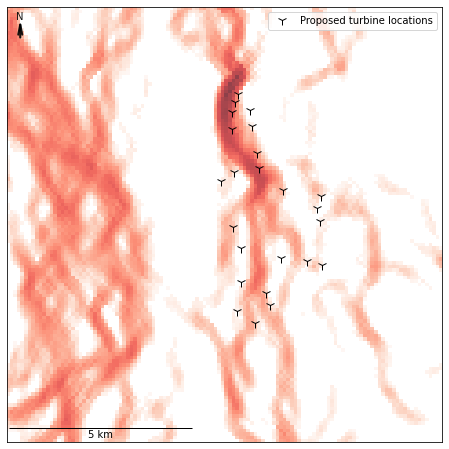

In [37]:
# plot the presence density map
fig, ax, _ = altpass_sim_original_3dep_100m.plot_presence_map_altamont(show=True, radius=200., )
ax.plot(turb_xlocs, turb_ylocs, '1k', markersize=10, label='Proposed turbine locations')
ax.legend()
xlims = ax.get_xlim(); ylims = ax.get_ylim()
ax.set_xlim([xlims[0]+9000, xlims[1]-9000]);  ax.set_ylim([ylims[0]+9000, ylims[1]-9000])